# Analysis of price increase and how to move forward for OC&Gym
## A report by group B4

## Summary 

The objective of this report is to analyse the impact of the price change that OC&Gym implemented in 2016 and help them find strategies to increase revenue further. This was done by analysing KPIs such as subscriber numbers, churn rate, revenue and lifetime value. The deep-dive into different segments has provided key insights that were used to derive recommendations that tackle the problem of stagnating revenues. The introduction of new annual memberships, both a normal and off-peak version, will increase lifetime value of subscribers and therefore improve the revenue situation of OC&Gym. Furthermore, subscriber engagement and churn must become major focus points for the company due to the high constant churn rate of 20% and the fact that improving subscriber engagement will improve lifetime value through the average length of subscription. 

## Introduction

A price increase in 2016 across subscription types led to a less than anticipated increase in revenue for budget gym operator OC&Gym. We have been commissioned by the board to investigate the impact of the price rise, provide recommendations regarding new pricing strategies and to determine the reasons behind the slowing revenue and subscription numbers. 

The monthly standard subscription price increased by 29% while monthly flexible subscription prices increased by 19% in 2016. This led to a 40% revenue increase for 2016, though this was not significantly higher than the 30% average price increase over the previous three years given these large price increases. The annual growth of revenues has since slowed, however, with OC&Gym now in line with the average industry revenue growth rate of 4.9% [reference 1]. 

We hypothesise that the price change has led to a different segmentation of our subscriber base. That is, we expect the price increase to affect each subscriber segments differently. We believe that the price change had a short-term effect on churn behaviour, with temporarily high churn rates, though we expect that this reverted to the mean in the long-term across subscription types and segments. 

We remark that OC&Gym needs to increase its subscriber lifetime value (LTV) in order to address its revenue difficulties. We propose introducing measures to increase the average subscription length of our members, which would have a positive knock-on effect on LTV. Introducing an annual subscription offering could help accomplish that. Introducing an annual off-peak membership could help fill our gym at quieter hours and attract new members, all while positively impacting the LTV of our subscribers. 

## Technologies and techniques 

Analysis for this project was done using standard python libraries which are all included in anaconda python distribution. Our team has used Pandas to load and process CSV files for subscriber, visitation and pricing data. In order to perform timeseries analysis we imported python datetime utilities, and we used numpy to handle both timestamps and periods. Most visualisations in this notebook were created using matplotlib or seaborn which acts a wrapper for matplotlib library and removes boilerplate code. Seaborn allowed us to create faceted plots, which give a better insight into data with many categorical variables.  
 
To prepare relevant datasets we relied heavily on the use of filtering through either pandas loc method or numpy select. Moreover, to make plots reproducible and scalable we implemented our own functions to both segment data and generate plots. More information on custom functions is available in comments and code description sections. 

To compute our subscription duration, we noted that the ‘End Date’ given in the dataset was the last month subscribers went to the gym for every single month and thus we used the ‘End Date’ in our analysis as the last effective month of subscriptions (code in Appendix). 

We decided to plot all our graphs from January 2010 to January 2018 as to not distract the reader by effects at the start of OC&Gym and effects at the end of our data and allow him to focus on data from January 2010 to January 2018 with the emphasis on the price chance in January 2016. 
 
Finally, we tagged cells which take longer time to run with `%%time` Jupyter magic command. Certain datasets will require 2-8 minutes to be prepared and about 4-6 GB of RAM in order to be stored in memory. 

The following cells will go through importing the libraries we used for this report, importing the datasets and cleaning them, through standardising the date times and categorising the data to make segmentation and analysis easier. It will also include functions and creation of new datasets that will be used later in the results. 


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from datetime import timedelta
from datetime import datetime
from matplotlib import pyplot as plt
from IPython.display import display

In [2]:
path = '/Users/coralineduval/Downloads/'

In [3]:
rate_card = pd.read_csv(path+'Rate_card.csv')

In [4]:
user_subs = pd.read_csv(path+'User subscriptions.csv')
user_subs['join_date'] = pd.to_datetime(user_subs['Join Date'], format='%b-%y')
user_subs['end_date'] = pd.to_datetime(user_subs['End Date'], format='%b-%y')
udf = user_subs.copy()[user_subs.columns.drop(['Join Date', 'End Date'])]
udf['status'] = udf.end_date.map(lambda x: 'active' if pd.isnull(x) else 'inactive')
udf['sub_duration'] = (udf.end_date.fillna(udf.join_date.max()) - udf.join_date) + timedelta(days=30)
udf['sub_duration_month'] = udf['sub_duration'] / np.timedelta64(1, 'M')
udf['sub_duration_month'] = udf['sub_duration_month'].map(lambda x: int(round(x)))

In [5]:
%%time
visitations1 = pd.read_csv(path+'visitationdataPART1.csv')
visitations2 = pd.read_csv(path+'visitationdataPART2.csv')
visitation_df = pd.concat([visitations1, visitations2]).reset_index(drop=True)
visitation_df['visit_datetime'] = pd.to_datetime(visitation_df.visitdate + ' ' + visitation_df.TimeofVisit)

# we created new columns with each of those features to make analysis and plotting easier
visitation_df['Year']=visitation_df['visit_datetime'].dt.year
visitation_df['Month']=visitation_df['visit_datetime'].dt.month
visitation_df['Weekday']=visitation_df['visit_datetime'].dt.day_name()
visitation_df['Hour']=visitation_df['visit_datetime'].dt.hour
visitation_df['day_of_month']=visitation_df['visit_datetime'].dt.day

CPU times: user 1min 1s, sys: 32.9 s, total: 1min 34s
Wall time: 1min 49s


In the following cell we created a dataframe that joined visitation information to compute the weekly activity of a subscriber (how often he/she goes to the gym er week) and its type which depends on whether a subscriber goes most often at peak or off-peak time. This dataset will be used for our segmentation analysis.

In [6]:
vdf = visitation_df[['CustomerID', 'peakvisits']].groupby('CustomerID').agg(
    vsum=('peakvisits', 'sum'), visits=('peakvisits', 'count')
    ).reset_index()
vdf['peak_rate'] = vdf.vsum / vdf.visits
vdf = vdf[['CustomerID', 'peak_rate', 'visits']]

customer_df = pd.merge(left=udf, right=vdf, on='CustomerID')
customer_df['weekly_activity'] = customer_df.visits / customer_df.sub_duration.dt.days * 7
customer_df['visitor_type'] = customer_df['peak_rate'].apply(lambda x: 'Peak' if x >= 0.5 else 'Off-peak')
customer_df['age'] = customer_df['join_date'].dt.year - customer_df['BirthYear']
customer_df['sub_duration'] = customer_df['sub_duration'].apply(lambda x: x.days if type(x) != int else x)
customer_df['income'] = customer_df.Affluence.map({'A':'Wealthy', 'B':'Middle-class', 'C1':'Middle-class', 'C2':'Low-income', 'DE':'Unemployed'})
customer_df['sub_type'] = customer_df['Subscription Type']
customer_df.join_date = customer_df.join_date.dt.to_period('M')
customer_df.end_date = customer_df.end_date.dt.to_period('M')

#creating categories for our age groups.
conditions = [
    (customer_df['age'] >=18) & (customer_df['age'] <=25),
    (customer_df['age'] >25) & (customer_df['age'] <= 35),
    (customer_df['age'] >35) & (customer_df['age'] <= 45),
    (customer_df['age'] >45) & (customer_df['age'] <= 55),
    (customer_df['age'] > 55)
    ]
values = ['18-25', '26-35', '36-45','46-55', '56+']
customer_df['age_cat']=np.select(conditions, values)

# creating categories for our computed weekly activity
conditions = [
    (customer_df['weekly_activity'] <=1),
    (customer_df['weekly_activity'] >1) & (customer_df['weekly_activity'] <=2),
    (customer_df['weekly_activity'] >2) & (customer_df['weekly_activity'] <=3),
    (customer_df['weekly_activity'] >3) & (customer_df['weekly_activity'] <=5),
    (customer_df['weekly_activity'] >5)
    ]
values = ['1 and less', '1-2', '2-3','3-5','5+']
customer_df['weekly_activity_cat']=np.select(conditions, values)

Filtering the customer dataframe to only keep columns needed :

In [7]:
features = ['CustomerID', 'Club', 'Gender', 'income',
            'sub_type', 'sub_duration', 'visitor_type',
            'visits', 'join_date', 'end_date', 'status',
            'weekly_activity_cat', 'age_cat' ]
c_df = customer_df.filter(features, axis=1)

This next cell comprise of a collection of functions used for exploratory data analysis. They facilitate segmentation of customers across time, membership type and whether they have joined or left a gym.

In [8]:
# This function groups dataframe by subscription type, chosen categories (eg. gender, age, etc.)
# and selects values for either customers leaving or joining the gym.
def prep_group(df, action, categories):
    action_map = {'leave':'end_date', 'join':'join_date'}[action]
    r = df.groupby([action_map, 'sub_type'] + categories).size().reset_index()
    r = r.rename(columns={"join_date": "Time", 0: "Customers", "end_date": "Time"})
    r['action'] = {'leave':'Leaver', 'join':'Joiner'}[action]
    r.Time = r.Time.dt.to_timestamp()
    return r
# Main function that merges data acquired from all the helper functions and produces a segmented dataset
# that can be used to make a faceted plot
def segment(df, categories):
    if type(categories) == str:
        categories = [categories]
    j = prep_group(df, 'join', categories)
    l = prep_group(df, 'leave', categories)
    seg = pd.concat([j,l])
    result = pd.merge(left=seg, right=get_net(j, l, categories), on=['Time', 'sub_type'] + categories, how='outer').fillna(0)
    return result
# Uses seaborn to output segmented data as a facet plot, includes conditions to format legends to avoid clutter.
def plot_segment(df, segment):
    g = sns.FacetGrid(df, col="sub_type", row="action", aspect=1.4, height=4.5)
    if segment:
        g.map(sns.lineplot, 'Time', 'Customers', segment)
    else:
        g.map(sns.lineplot, 'Time', 'Customers')
    for ax in g.axes.flatten():
        ax.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey')
        if segment != 'Club' and segment:
            ax.legend()
        else:
            if ax == g.axes.flatten()[2]:
                ax.legend(ncol=3, loc='upper left')
# Auxhillary function that adds total number of customers and net customer gain/loss per month
# the output of this function is being merged with the main segment function
def get_net(j, l, categories):
    net_total_df = pd.merge(left=j, right=l, on=['Time', 'sub_type'] + categories, how="outer").fillna(0)
    net_total_df['Net_Customers'] = net_total_df.Customers_x - net_total_df.Customers_y
    ntd = net_total_df.copy()[['Time', 'sub_type'] + categories + ['Net_Customers']]
    ntd['Total_Customers'] = ntd.groupby(['sub_type'] + categories).cumsum()
    return ntd
# This function converts segmented dataframe values from absolute to relative, it is used to compare growth rates
# instead of total subscriber numbers
def to_relative(df):
    totals = df.groupby(['Time', 'sub_type']).sum().reset_index()
    totals['Total_Customers_lm'] = totals.Total_Customers.shift(2)
    final = pd.merge(left=df, right=totals[['Time','sub_type','Total_Customers_lm']], on=['Time', 'sub_type'], how='left')
    final['abs_Customers'] = final.Customers
    final.Customers = final.abs_Customers / final.Total_Customers_lm
    return final.loc[final.Time != '2009-05-01']


This following cell is a set of modified functions from the previous block in order to deal with data comparisons by club. These functions exclude segmentation by subscription type and provide some additional metrics that are relevant only for club comparisons.

In [9]:
# Plots series of linegraphs based on subscriber demographics faceted by selected Clubs
def plot_comparison(data, metric):
    plt.subplots(figsize=(15,5)) # Change figsize for smaller plots
    sns.lineplot(data=data, x='Time', y=metric, hue='Club')
    plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
    plt.title(metric)
    plt.legend()
    plt.axhline(0, linestyle='dashed', color='lightgrey')
# prep_group function adjusted to group data by Club
# (duplication could be avoided by parametrising prep_group further)
def prep_group_club(df, action, categories):
    action_map = {'leave':'end_date', 'join':'join_date'}[action]
    r = df.groupby([action_map, 'Club'] + categories).size().reset_index()
    r = r.rename(columns={"join_date": "Time", 0: "Customers", "end_date": "Time"})
    r['action'] = {'leave':'Leaver', 'join':'Joiner'}[action]
    r.Time = r.Time.dt.to_timestamp()
    return r
# Segemntation funcion adjusted for Club data, it excludes totals and growth metrics
# as they are included in the dataset that is passed to this function
def segment_club(df, categories):
    if type(categories) == str:
        categories = [categories]
    j = prep_group_club(df, 'join', categories)
    l = prep_group_club(df, 'leave', categories)
    seg = pd.concat([j,l])
    return seg
# Plots series of linegraphs based on customer demographics faceted by selected Clubs
def plot_segmentation(df, segment):
    g = sns.FacetGrid(df, col="Club", row="action", aspect=1.5, height=5)
    g.map(sns.lineplot, 'Time', 'Customers', segment)
    for ax in g.axes.flatten():
        ax.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
        ax.legend()

In this next cell we created a dataframe that will be club specific. In it, we will compute the average length of subscriptions for those who joined in the first year, the average length of subscriptions for those who joined after that first year, the difference in average lengths between the two groups and the percentage change in subscription lengths. 

In [10]:
clubs = [club for club in customer_df.Club.unique()]

avg_subs1 = pd.DataFrame(columns=["group_1","group_2"],index=clubs)

months = 0
years = 1

for index in range(len(clubs)):
    start = customer_df[customer_df.Club == clubs[index]].join_date.dt.to_timestamp().min()
    end = start + pd.DateOffset(years=years,months=months)
    g1 = customer_df[(customer_df.Club == clubs[index]) & (customer_df.join_date.dt.to_timestamp() < end) & (customer_df.status == "inactive")]
    g2 = customer_df[(customer_df.Club == clubs[index]) & (customer_df.join_date.dt.to_timestamp() >= end) & (customer_df.status == "inactive")]
    avg_subs1.iloc[index, 0] = g1.sub_duration.mean()
    avg_subs1.iloc[index, 1] = g2.sub_duration.mean()
    avg_subs1 = avg_subs1.fillna(0)
    avg_subs1['difference'] = avg_subs1.group_1 - avg_subs1.group_2
    avg_subs1["%_difference"] = avg_subs1["difference"] / avg_subs1["group_1"]

This next section is used to prepare series of dataframes used to compare and analyse club data. They rely on modified customer segmentation functions and provide detailed breakdowns of club related metrics by month and year.

In [11]:
clubs_df = segment(c_df.loc[(c_df.Club != 'Redbridge')], 'Club') # Excluding Redbridge as the most recent clubs with little data
# Adding metrics to club data
agg_clubs = clubs_df.groupby(['Time', 'Club', 'action']).sum().reset_index()
agg_clubs['Total_Customers_lm'] = agg_clubs.Total_Customers - agg_clubs.Net_Customers
agg_clubs['Customer_change'] = agg_clubs.Customers / agg_clubs.Total_Customers_lm
agg_clubs['Monthly_growth'] = agg_clubs.Net_Customers / agg_clubs.Total_Customers
facet_clubs = agg_clubs.copy() # Saving the dataset for faceted plots
# Splitting segmented dataset into growth and churn datasets and then merging them back
# to pivot the table and remove redundant rows
user_growth = agg_clubs.loc[agg_clubs.action == 'Joiner'][agg_clubs.columns.drop('action')].rename(columns={
    'Customers': 'Acquisition', 'Customer_change': 'Acquisition_rate'})
churn = agg_clubs.loc[agg_clubs.action == 'Leaver'][agg_clubs.columns.drop('action')].rename(columns={
    'Customers': 'Churn', 'Customer_change': 'Churn_rate'})
common_cols=['Total_Customers_lm', 'Monthly_growth', 'Total_Customers', 'Net_Customers']
clubs = pd.merge(left=churn[churn.columns.drop(common_cols)], right=user_growth, on=['Time','Club'])
# Create a dataset showing annual growth of clubs from 2017 to 2018 and including club opening dates 
clubs_dfc = clubs_df.copy().loc[clubs_df.Time.isin(['2017-12-01','2018-12-01'])].groupby(['Time', 'Club', 'action']).sum().reset_index()
clubs_dfc['year'] = clubs_dfc.Time.dt.year
agg_club = clubs_dfc[['Club', 'Total_Customers', 'year']].drop_duplicates()
growth = agg_club.pivot(index='Club', columns='year', values='Total_Customers').reset_index()
growth['growth'] = (growth[2018] - growth[2017]) / growth[2017]
club_openings = c_df.groupby('Club').min().join_date.reset_index()
growth = pd.merge(left=growth, right=club_openings, on='Club').rename(columns={'join_date':'opening_date'})

In this next cell we created a dataframe that will be used to compute per months the number of subscribers, whether overall or per categories (flexible or standard, depending on a specific club). This will allow us to compute the revenue as well as growth rates (for our revenue or our subscriber evolution).

In [12]:
%%time
#creating the new dataframe that will have the months concerned by our report as its index
df_per_month_over_months=pd.date_range(start='2009-05-01', end='2018-12-01', freq='MS')
df_per_months= pd.DataFrame(df_per_month_over_months,columns = ['Date']) 
df_per_months.set_index('Date', drop=True, inplace=True)

#initialising the new columns added to the dataframe
df_per_months['count_flexible']=0
df_per_months['count_standard']=0
df_per_months['count_join']=0
df_per_months['count_leave']=0
df_per_months['count_leave_westminster']=0
df_per_months['count_all_westminster']=0
df_per_months['revenues_flexible']=0
df_per_months['revenues_standard']=0
df_per_months['growth_rate']=0.0
df_per_months['growth_rate_count']=0.0
df_per_months['growth_count_join']=0.0
df_per_months['growth_count_churn']=0.0
df_per_months['count_churn']=0.0
df_per_months['count_churn_westminster']=0.0

#for all our subscribers, we will count how many months they stayed on which type of subscription
for i in range(len(user_subs)):
    start=user_subs['join_date'][i]
    end=user_subs['end_date'][i]
    # if the subscriber is still active, we use the last date of our project as our last recorded active month
    if pd.isnull(end):
        end = user_subs['join_date'].max()
    subs=user_subs['Subscription Type'][i]

    #noting the month when joined to compute joining fees and the month when left to compute churn
    df_per_months['count_join'][start]+=1
    df_per_months['count_leave'][end]+=1
    
    #checking if the subscription is flexible or standard to know what type of subscription to count
    if subs=='Flexible':
        # for each month between the start and the end of the subscription, we add 1 count to the df_per_months count
        for j in pd.date_range(start, end, freq='MS'):
            df_per_months['count_flexible'][j]+=1
    if subs=='Standard':
        for j in pd.date_range(start, end, freq='MS'):
            df_per_months['count_standard'][j]+=1
    
    #we will need the churn rate for the club in Westminster so we are gathering information to be able to compute it
    if user_subs['Club'][i]=='Westminster':
        df_per_months['count_leave_westminster'][end]+=1
        for j in pd.date_range(start, end, freq='MS'):
            df_per_months['count_all_westminster'][j]+=1

#computing the revenue from the number of subscribers per months and the price of subscriptions given in the rate_card dataframe (see joined file to see how it made)
df_per_months['revenues_join']=df_per_months['count_join']*6 #join fee is always 6£
for i in df_per_months.index:
    df_per_months['revenues_flexible'][i]=df_per_months['count_flexible'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Flexible']
    df_per_months['revenues_standard'][i]=df_per_months['count_standard'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Standard']
df_per_months['all']=df_per_months['revenues_flexible']+df_per_months['revenues_standard']+df_per_months['revenues_join']
df_per_months['count_all']=df_per_months['count_flexible']+df_per_months['count_standard']
#Computing the average revenue per user by dividing the total revenue per the number of users each months
df_per_months['ARPU']=df_per_months['all']/df_per_months['count_all']
# from the ARPU, let's compute the lifetime value of our subscribers per months
df_per_months['lifetimevalue']=df_per_months['ARPU']*customer_df.groupby(customer_df['join_date'].dt.to_timestamp()).mean()['sub_duration_month']

# looping over df_per_month to compute the chrun and the growth rates
for i in range(1,len(df_per_month_over_months)):
    now=df_per_month_over_months[i]
    before=df_per_month_over_months[i-1]

    # computing the churn for our global subscriber base and for the club in Westminster
    df_per_months['count_churn'][now]=df_per_months['count_leave'][now]/df_per_months['count_all'][before]
    df_per_months['count_churn_westminster'][now]=df_per_months['count_leave_westminster'][now]/df_per_months['count_all_westminster'][before]

    #computing the growth rate of our revenue, our overall subscribers and our new subscribers
    df_per_months['growth_rate'][now]=(df_per_months['all'][now]-df_per_months['all'][before])/df_per_months['all'][before]
    df_per_months['growth_rate_count'][now]=(df_per_months['count_all'][now]-df_per_months['count_all'][before])/df_per_months['count_all'][before]
    df_per_months['growth_count_join'][now]=(df_per_months['count_join'][now]-df_per_months['count_join'][before])/df_per_months['count_join'][before]   

# creating a per year version to have our growth rates per year
df_per_year=df_per_months.groupby(pd.Grouper(freq='Y')).sum()
df_per_year['growth_rate']=0.0
df_per_year['growth_rate_count']=0.0
for i in range(2,len(df_per_year['growth_rate'])):
    now=df_per_year.index[i]
    before=df_per_year.index[i-1]
    df_per_year['growth_rate'][now]=(df_per_year['all'][now]-df_per_year['all'][before])/df_per_year['all'][before]
    df_per_year['growth_rate_count'][now]=(df_per_year['count_all'][now]-df_per_year['count_all'][before])/df_per_year['count_all'][before]


CPU times: user 13min 23s, sys: 13.1 s, total: 13min 36s
Wall time: 13min 49s


## Results
## 1. What happened when the price was increased? What is the current situation?  
### 1. A. Subscriber numbers
#### 1. A. 1. Total Subscriber
#### 1. A. 1. a) Subscriber base 

As OC&Gym is a subscription business, where most if not all its revenue come from subscriptions sold, the number of active subscribers is a key metric for the business and will have a direct impact on revenue. As such, we plotted the number of subscribers and the growth rate of this number per month to understand the subscriber base of OC&Gym.  

We see from the below graphs that our subscriber base has grown steadily since 2010, at around 2% per month. Subscriber numbers rebounded quickly in 2016 following the large number of cancellations that occurred in relation to the price increase. This price increase led to an approximate 15% fall in total subscribers, though this proved to be a temporary dip and numbers were soon restored to their previous levels. The subscriber base has experienced a recent slowdown in growth, raising fears that subscriber numbers may have plateaued under the current pricing system.  


Text(0.5, 1.0, 'Growth rate of subscribers')

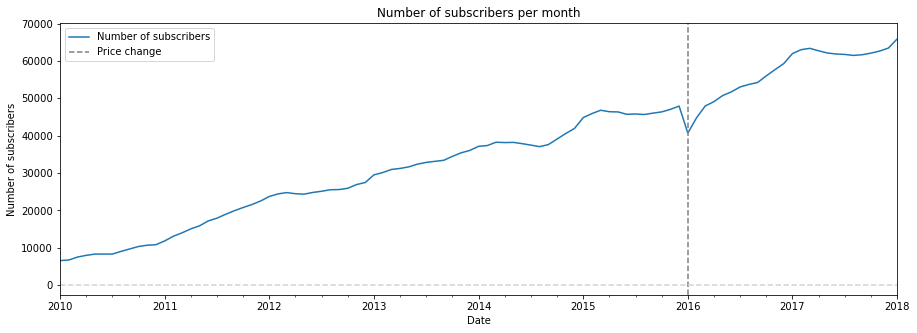

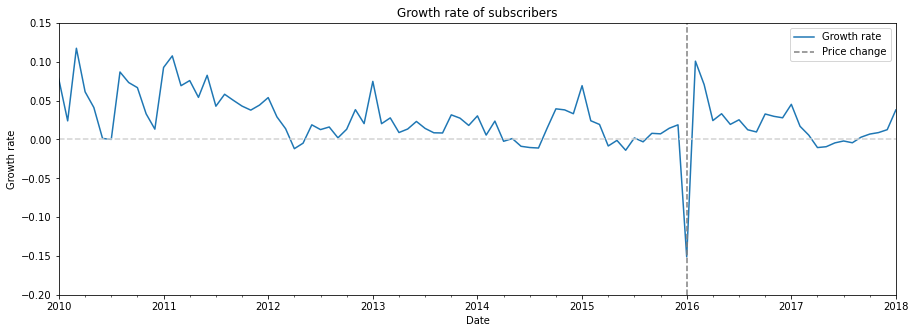

In [13]:
plt.figure(figsize=(15,5))
df_per_months['count_all'].plot(label="Number of subscribers")
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.ylabel('Number of subscribers')
plt.legend()
plt.title('Number of subscribers per month')

plt.figure(figsize=(15,5))
df_per_months['growth_rate_count'].plot(label="Growth rate")
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.ylim(-0.2,0.15)
plt.legend()
plt.ylabel('Growth rate') 
plt.title('Growth rate of subscribers')

#### 1. A. 1. b) New Subscribers 

Subscriber numbers have increased throughout the period, displaying some seasonality with spikes at the beginning of each year as people sign up as a result of New Year’s resolution. Recent data suggests that the number of new subscribers may have peaked. As OC&Gym opened on average 5-6 gyms from 2009 to 2016, and that newly opened gyms tend to have high new subscriber growth rates, it can explain some of the volatility in these rates that we saw at the beginning of the 2010s. The average new subscriber rate was 2% over the period, though this rate currently stands at around 1%, excluding the usual January spike, which comes to show that OC&Gym has had a harder time recently finding new subscribers. This could come from the price increase, but also from other factors that we will explore later.  

Text(0.5, 1.0, 'Growth Rate of new subscribers')

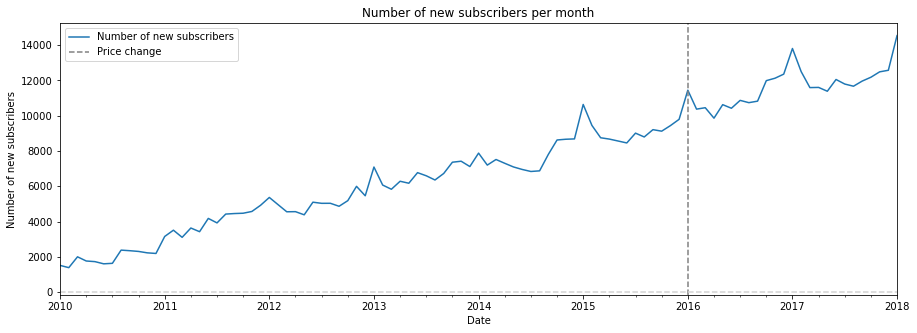

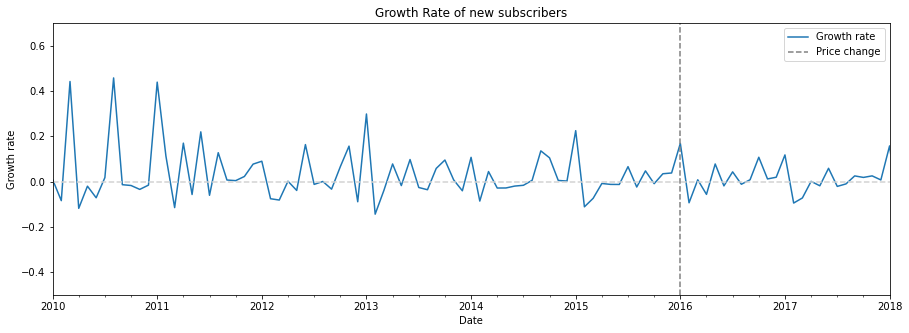

In [14]:
plt.figure(figsize=(15,5))
df_per_months['count_join'].plot(label="Number of new subscribers")
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.ylabel('Number of new subscribers')
plt.legend()
plt.title('Number of new subscribers per month')

plt.figure(figsize=(15,5))
df_per_months['growth_count_join'].plot(label="Growth rate")
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.ylim(-0.5,0.7)
plt.ylabel('Growth rate') 
plt.legend()
plt.title('Growth Rate of new subscribers')

#### 1. A. 1. c) Churn Rate 

As we have seen in the previous section that we are continuing to gain subscribers, we also need to explore churn to understand our total number subscribers. Churn is also a vital part of any subscription business and it thus central to our analysis here. 

We computed our churn rate as the number of subscribers leaving a certain month divided by the number of subscribers at the beginning of the month. 

The churn rate has remained remarkably flat throughout the period on aggregate, except for the temporary increase related to the 2016 price rise. The churn rate is consistently about 20% per month. This overall trend shows that across all gyms, we are not losing more subscribers once the price change has taken into effect and that our overall churn has not been affected by this price change. We will go into more detail in a later part of this report into churn and specifically churn per club. 

Text(0.5, 1.0, 'Churn per month')

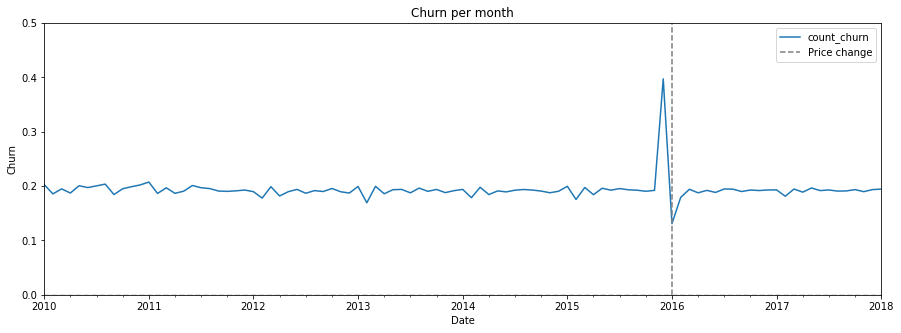

In [15]:
plt.figure(figsize=(15,5))
df_per_months['count_churn'].plot()
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.ylim(0,0.5)
plt.ylabel('Churn')
plt.legend()
plt.title('Churn per month')

 #### 1. A. 2. Customer Segments

#### 1. A. 2. a) Split of Customer Segments 

We then decided to go into more depth in our total number of subscribers and look across different segment and their impact into the makeup of our current subscribers. We looked at the impact of the type of membership chosen, the type of subscriber (whether he/she goes more at peak or non-peak time), but also at the age groups, the genders, the affluence groups, the club groups and the average weekly visits to the gym (see appendix for the last 4 segments).  

We can see from the below graphs that almost 90% of our subscribers are of the Standard subscription type, which could mean that most subscribers are not interested in short term subscriptions or are planning to stay long enough that they would not be impacted by the 3-month notice of the standard subscription.  

We can also see that we labelled roughly 33% of our subscribers as being “off-peak subscribers”, meaning most of their visits to the gym came at the quieter, non-peak hours. Thus, there might be an opportunity to develop this segment, as moreover the gym still has lots of capacity at non-peak hours (see Number of visitors in the gym over 2009 - 2018 per hour in the Appendix). It also could imply that the gym is very crowded at peak hours, as most subscribers go at that time. We will explore later in this report if that could have an impact on our churn.   

Text(0, 0.5, 'Number of subscribers')

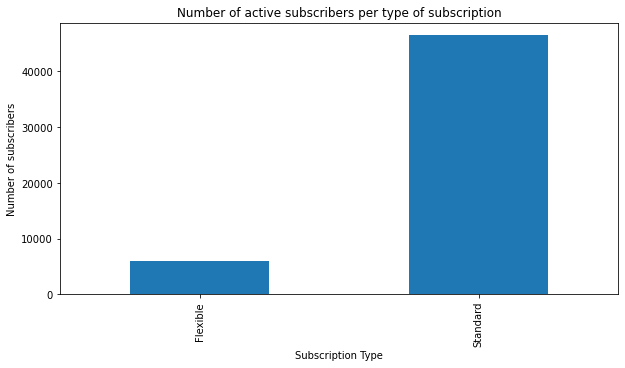

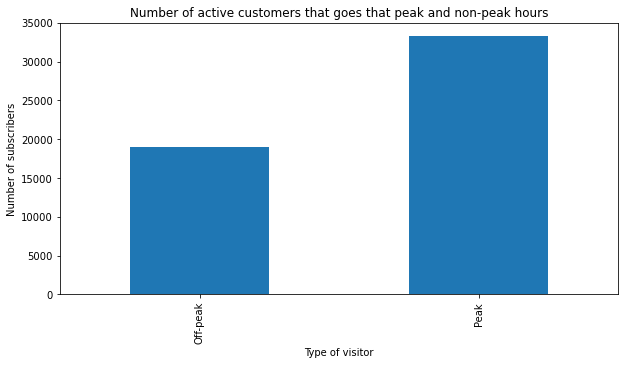

In [16]:
plt.figure(figsize=(10,5))
customer_df[customer_df["status"]=="active"].groupby('Subscription Type').count()['CustomerID'].plot(kind='bar')
plt.title('Number of active subscribers per type of subscription')
plt.ylabel('Number of subscribers')

plt.figure(figsize=(10,5))
customer_df[customer_df["status"]=="active"].groupby('visitor_type').count()['CustomerID'].plot(kind='bar')
plt.title('Number of active customers that goes that peak and non-peak hours')
plt.xlabel('Type of visitor')
plt.ylabel('Number of subscribers')

#### 1. A. 2. b) Important Customer Segments that differ 

We wanted to analyse the differences across segments in terms of subscriber join rates and churn rates. This analysis was carried out for all segments across both Standard and Flexible subscription types and can be found in the appendix. No clear patterns among segments were found, apart from the difference between Flexible and Standard membership. 

We found that Flexible subscription types had higher subscriber join rates and churn rates. This makes intuitive sense - the appeal behind the Flexible subscription type is the ease at which members can cancel their contracts if their plans change. 

These graphs were calculated so that we can see the contribution of each segment to total Standard/Flexible subscriber join rate and total churn rate. In other words, these graphs enable to us to visualise which groups drive the join and churn rates. It is imperative, therefore, to consider the contribution of each segment relative to how much of the subscriber segment it makes up. The makeup of subscriber segments can be found in the appendix. Patterns across segments can still be identified using this method. 

#### 1. A. 3. Gyms
OC&Gym has opened gyms consistently from 2009 to 2016 and has since slowed down their openings up to reaching their goal of one gym per district. As we have seen in previously, the regular opening of clubs has allowed for regular increases of new subscribers. Understanding the importance of individual clubs in the subscriber numbers is vital for OC&Gym as it will allow them to target low and high performing clubs better than a global stategy would.  

The below chart shows us the number of active subscribers at each of the 32 locations. The range in members is relatively narrow. Each gym has more than 1000 and less than 2250 members.  

Text(0, 0.5, 'Number of subscribers')

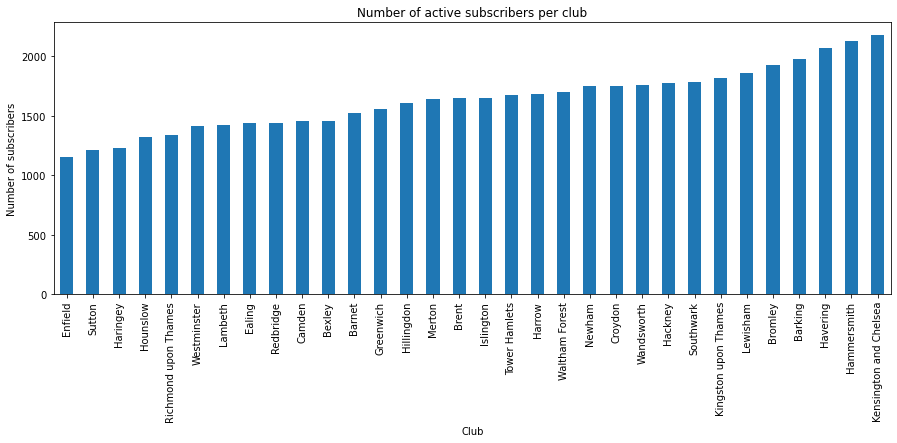

In [17]:
plt.figure(figsize=(15,5))
customer_df[customer_df["status"]=="active"].groupby('Club').count()['CustomerID'].sort_values().plot(kind='bar')
plt.title('Number of active subscribers per club')
plt.ylabel('Number of subscribers')

#### 1. A. 3. a) Analysis of all gyms

An analysis of the total subscriber growth rate of all gyms over 2018 revealed that there are large differences in growth rates across clubs. Clubs that have opened more recently tend to have higher growth rates due to their relatively lower bases. The below tables indicate that subscriber numbers fell in several gyms during 2018. This may offer a suggestion as to why the total subscriber growth rate seems to be stagnating, as older gyms find it more difficult to grow at the same rates they once did. 

In [18]:
print('Clubs with high growth rate :')
display(growth.sort_values(by='growth',ascending=False).head(8))
print()
print('Clubs with low growth rate :')
display(growth.sort_values(by='growth',ascending=True).head(8))

Clubs with high growth rate :


,Club,2017,2018,growth,opening_date
15,Hillingdon,630.0,1604.0,1.546032,2017-12
11,Hammersmith,1906.0,2126.0,0.115425,2017-06
18,Kensington and Chelsea,2003.0,2178.0,0.087369,2016-12
8,Enfield,1097.0,1154.0,0.051960,2010-03
3,Brent,1568.0,1646.0,0.049745,2014-10
23,Newham,1706.0,1750.0,0.025791,2014-09
10,Hackney,1746.0,1776.0,0.017182,2015-12
6,Croydon,1724.0,1751.0,0.015661,2013-06



Clubs with low growth rate :


,Club,2017,2018,growth,opening_date
16,Hounslow,1805.0,1319.0,-0.269252,2009-05
2,Bexley,1673.0,1460.0,-0.127316,2015-07
12,Haringey,1336.0,1225.0,-0.083084,2012-11
22,Merton,1757.0,1638.0,-0.067729,2016-07
29,Wandsworth,1884.0,1759.0,-0.066348,2013-10
19,Kingston upon Thames,1921.0,1814.0,-0.055700,2016-05
25,Southwark,1888.0,1784.0,-0.055085,2014-03
0,Barking,2094.0,1980.0,-0.054441,2016-03


#### 1. A. 3. b) Comparison of High-growth and Low-growth locations 

We aimed to investigate differences between a well-performing gym and a poorly performing gym. We ranked gyms based on subscriber growth rate in 2018 and selected one gym with a high growth rate and one gym with a low growth rate, ensuring they had reasonably similar opening dates. In this analysis, we used Brent as our well-performing gym and Southwark as our poorly performing gym. 

We noticed that monthly subscriber growth rates were largely in line with each other, with rates for Brent being slightly higher on average over the period. More interestingly though was the fact that churn rate and subscriber join rates were consistent significantly greater for Brent over the period. It is clear that the higher churn rate for Brent was being sufficiently offset by a high acquisition rate. 

This motivated us to investigate the differences further by seeing if we could see any differences in patterns across segments. This full analysis can be found in the appendix. In conclusion, we did not find any significant difference in patterns between the gyms across any of the segments we looked at. An example of this analysis is given below, where frequency of gym visit was chosen as the segment. There is no clear difference in the patterns in either graph. This suggested to us that some external factor may be influencing the subscriber growth rates in these gyms. We posit that Southwark’s central location may play a part, as this area of London is likely to be a very saturated area in terms of gyms. 

Text(0.5, 1.0, 'Montly churn rate of number of subscribers')

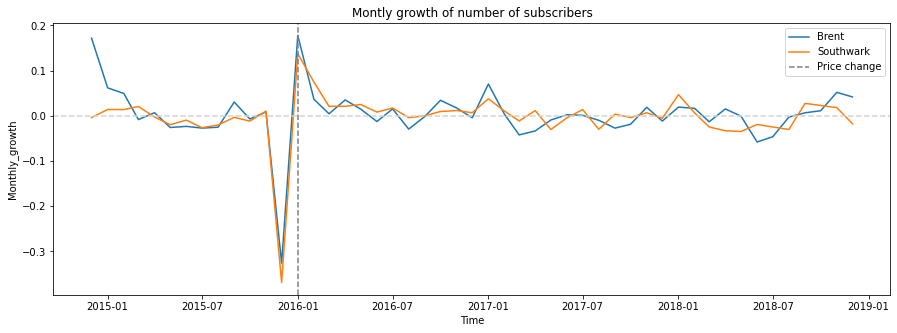

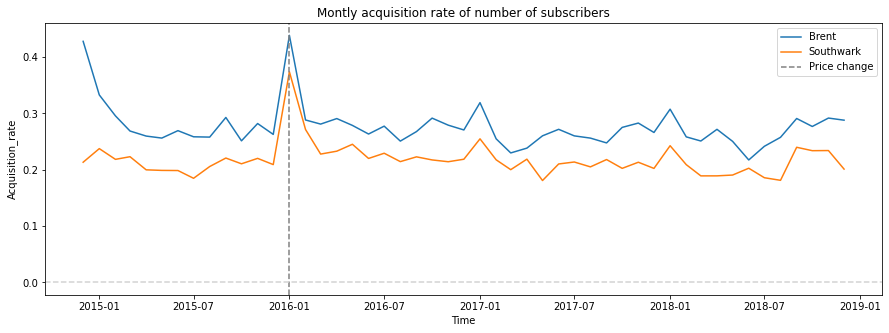

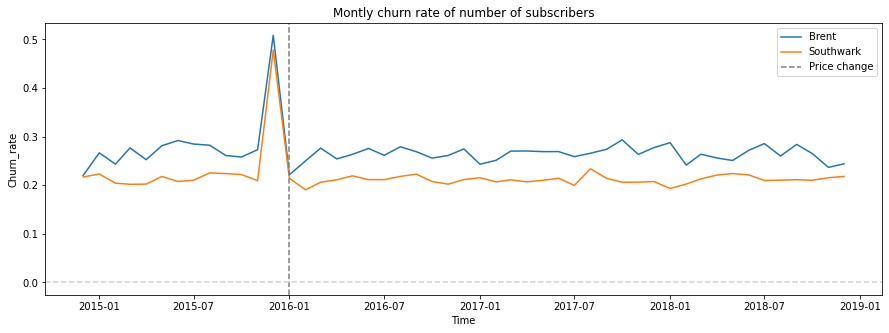

In [19]:
comparison = ['Brent', 'Southwark'] # 2 clubs, opened in the same year, 5% growth vs 5.5% decline
data = clubs.loc[(clubs.Club.isin(comparison)) & (clubs.Time >= '2014-12-01')]

#Dip in subsscribers happens before price chage due to announcement
plot_comparison(data, 'Monthly_growth')
plt.title('Montly growth of number of subscribers')
plot_comparison(data, 'Acquisition_rate')
plt.title('Montly acquisition rate of number of subscribers')
plot_comparison(data, 'Churn_rate')
plt.title('Montly churn rate of number of subscribers')

### 1. B. Revenue and Average revenue per subscriber

### 1. B. 1. Total Revenue and Average revenue per subscriber (APRU) 

Total revenue, as well as revenue growth, is shown in the graphs below. We notice that the total revenue curve follows a similar path to the total subscriber's curve, though the drop as a result of the 2016 price rise is much less pronounced. Revenue increased rapidly again as subscriber growth stabilised following this price hike, suggesting that subscribers are not very price sensitive. This raises the possibility of further price increases and begs the question whether the price rise was large enough in order to satisfy the revenue target OC&Gym had.  Revenue increased by 40% in 2016 after the price increase. 

The graph below show that there is obviously a direct relationship between the number of subscribers and the revenue the company generates. This relationship can be captured by Average Revenue per User (ARPU). (This is an important metric for a subscription company such as OC&Gym.) We see the direct impact the price increase had on ARPU, increasing it from £23 to £29. ARPU has decreased slightly in recent years, as it depends on the amount of users of subscription types. 

Text(0.5, 1.0, 'Average Revenue per subscriber per months')

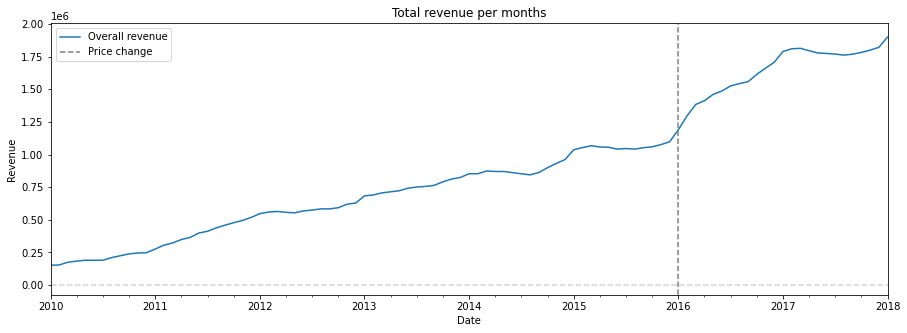

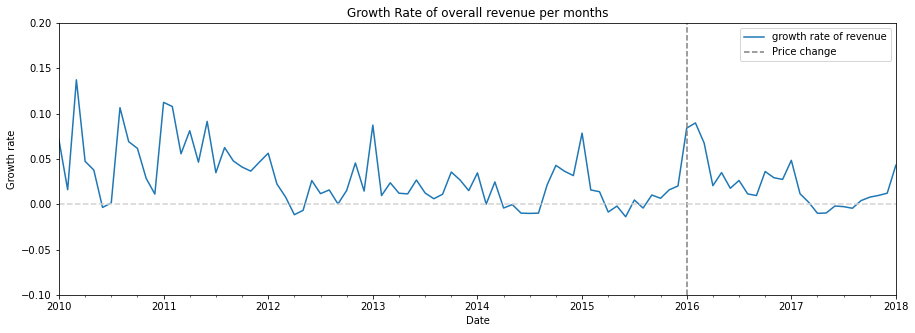

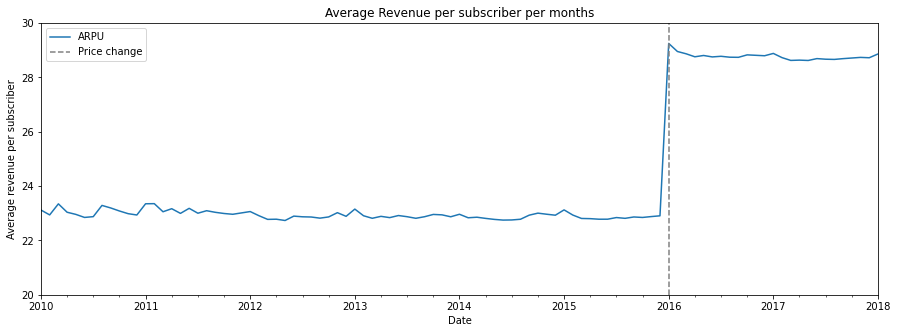

In [20]:
df_per_months.plot(y='all',figsize=(15,5), label='Overall revenue')
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.ylabel('Revenue') 
plt.legend()
plt.title('Total revenue per months')

df_per_months.plot(y='growth_rate',figsize=(15,5), label='growth rate of revenue')
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.ylim(-0.1,0.2)
plt.ylabel('Growth rate') 
plt.legend()
plt.title('Growth Rate of overall revenue per months')

df_per_months.plot(y='ARPU',figsize=(15,5), label='ARPU')
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.xlim('2010-01-01','2018-01-01')
plt.ylim(20,30)
plt.ylabel('Average revenue per subscriber') 
plt.legend()
plt.title('Average Revenue per subscriber per months')

### 1. C. Life time value of subcribers
#### 1. C. 1. Total subscribers : subscription length over time and life time value of subscribers

The graph below shows the average subscriber length of stay over time. Apart from the short-term drop caused by the price change, the average duration has remained remarkably stable around 5 months. 

Turning length of stay, by multiplying it with ARPU, we get a similar picture. The difference occurs after the price change at the end of 2015. We can see that LTV has been increase from ~120 GBP to ~150GBP. As average length of stay, LTV remained constant over time (apart from increase after the price change). OC&Gym has experienced a gradual drop in the build-up to the price change (caused by increased churn), but this was immediately offset in 2016.

Text(0.5, 1.0, 'Life time value of subscribers per month they joined the gym')

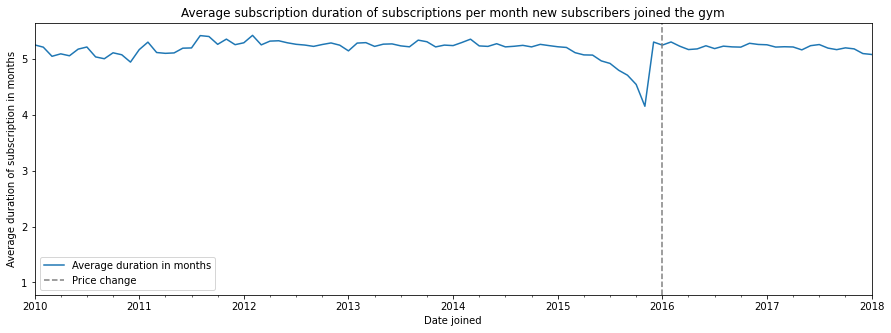

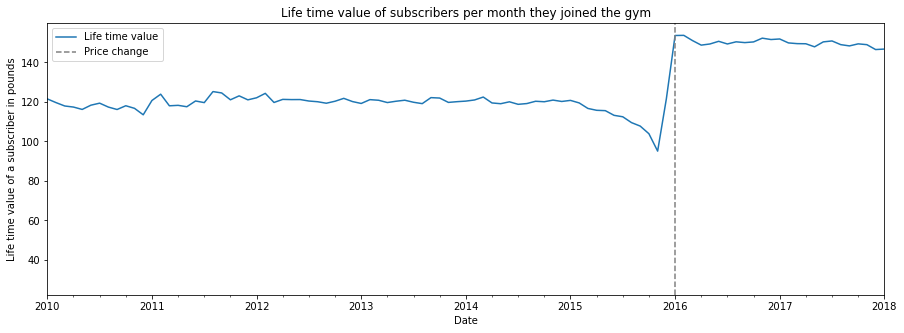

In [21]:
customer_df.groupby(['join_date']).mean()['sub_duration_month'].plot(label='Average duration in months',figsize=(15,5))
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.xlim('2010-01-01','2018-01-01')
plt.ylabel('Average duration of subscription in months') 
plt.xlabel('Date joined') 
plt.legend()
plt.title('Average subscription duration of subscriptions per month new subscribers joined the gym')

plt.figure(figsize=(15,5))
df_per_months['lifetimevalue'].plot(label='Life time value',figsize=(15,5))
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.xlim('2010-01-01','2018-01-01')
plt.ylabel('Life time value of a subscriber in pounds') 
plt.legend()
plt.title('Life time value of subscribers per month they joined the gym')

#### 1. C. 2. Customer segments 
The goal of this part is to further investigate the differences in LTV across different subscriber segments. Due to the limited scope of this analysis, the most important differences have been chosen and will be presented in more detail below: 

 - Flexible & Standard Memberships 

There is a large difference between cohorts when split by membership types. This is expected as the subscriber that opts for a flexible membership is by 	nature more likely to churn. It is however, both memberships seem to have a relatively constant average length of stay. 

In [22]:
#we will need customer_df.join_date as a timestamp here
customer_df['join_date'] = customer_df['join_date'].dt.to_timestamp()

Text(0.5, 1.0, 'Average duration of subscription per type of subscription')

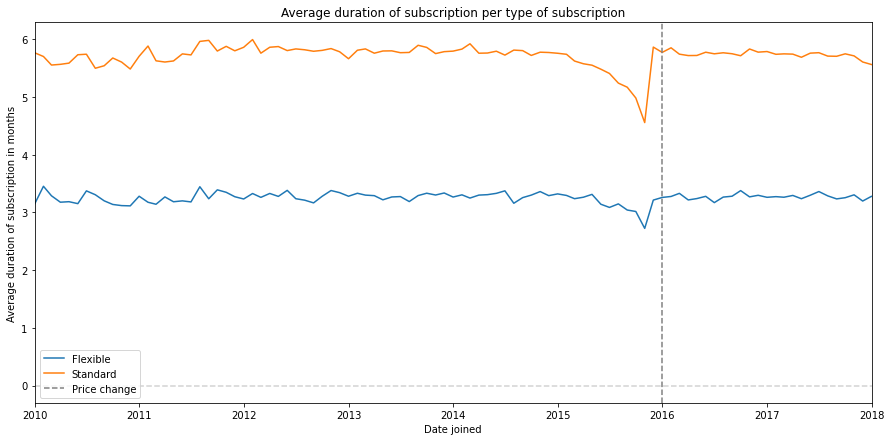

In [23]:
plt.figure(figsize=(15,7))
sns.lineplot(x='join_date', y="sub_duration_month", hue='Subscription Type', data=customer_df.groupby(['join_date','Subscription Type']).mean())
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.xlabel('Date joined') 
plt.ylabel('Average duration of subscription in months')
plt.legend()
plt.title('Average duration of subscription per type of subscription')

- Frequency of gym visits 

For the following graph it is important to remember the distribution of the subscribers compared to the total subscriber base. The graph below shows 	with increasing number of visits, the subscription length increases equally. What does this mean? It shows clearly that the more engaged a subscriber is 	the more likely he is to be a “long-term” subscriber for OC&Gym. This provides interesting insights that can be used to increase LTV. 

Text(0.5, 1.0, 'Number of active subscriptions per categories')

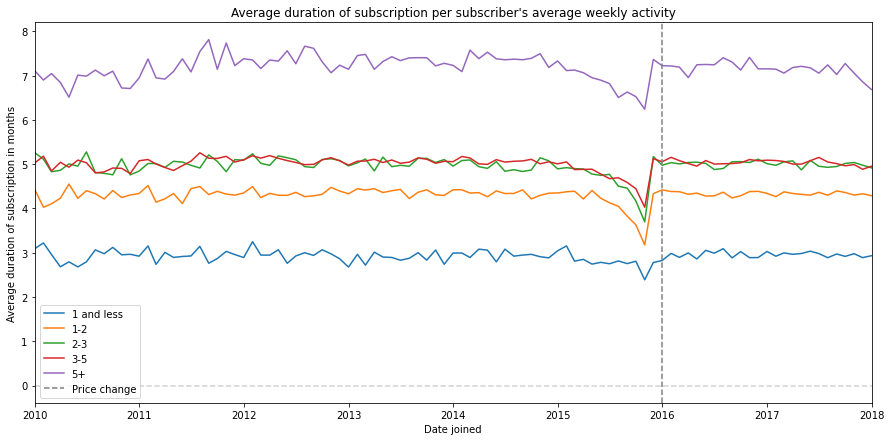

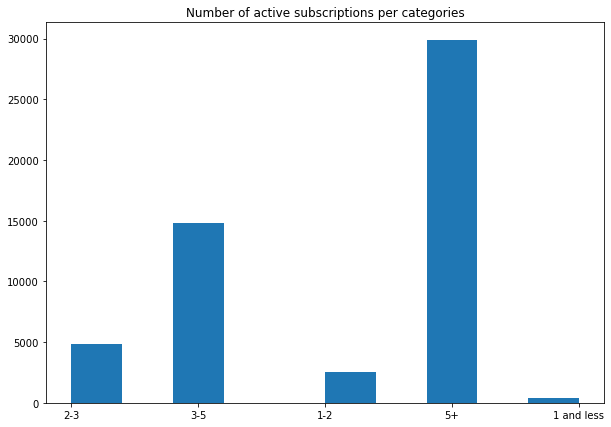

In [24]:
plt.figure(figsize=(15,7))
sns.lineplot(x='join_date', y="sub_duration_month", hue='weekly_activity_cat', data=customer_df.groupby(['join_date','weekly_activity_cat']).mean())
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.xlabel('Date joined') 
plt.ylabel('Average duration of subscription in months')
plt.legend()
plt.title("Average duration of subscription per subscriber's average weekly activity")

plt.figure(figsize=(10,7))
plt.hist(customer_df[customer_df['status']=='active']['weekly_activity_cat'])
plt.title("Number of active subscriptions per categories")

#### 1. C. 3. Gyms
Next, we are doing the same for OC&Gyms clubs with the goal of understanding important differences across gyms. 
We chose the top 3 and bot tom 3 clubs in term on average length of subscription. The best 3 are : Havering, Harrow and Westminster while the botton 3 are : Merton, Brent and Sutton (Redbridge and Hillingdon were ignored as they are too recent and would not allow good comparison over time).

The graph below shows that the average length of subscription varies considerably across different gyms. Even though the graph shows newer gyms having a lower length of subscription, this pattern does not appear when running the analysis for all clubs.

Text(0.5, 1.0, "Average duration of subscription per subscriber's club (top 3 and bottom 3 clubs)")

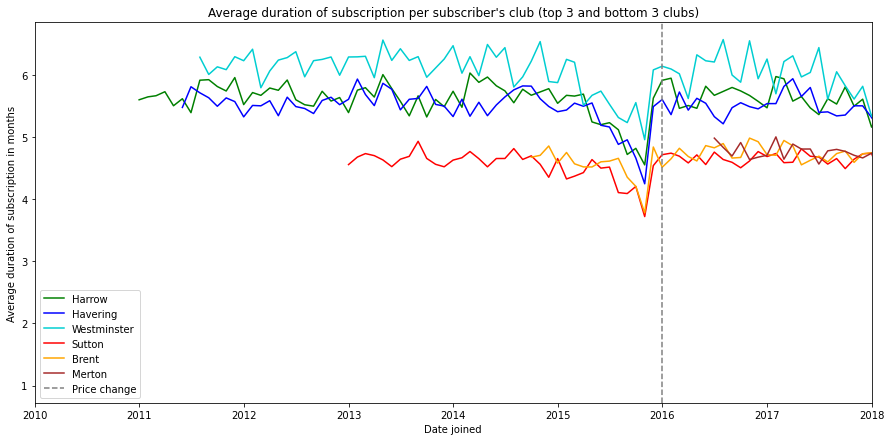

In [25]:
#displaying this following dataframe shows the best and worst clubs in term of average subscription duration
customer_df.groupby(['Club']).mean().sort_values(by="sub_duration_month")
#bottom 3 :  "Merton","Brent","Sutton" (Redbridge and Hillingdon : cannot be because too recent to compare with top 3 and visualise well on graph)
#top 3: Havering, Harrow, Westminster

plt.figure(figsize=(15,7))
sns.lineplot(x='join_date', y="sub_duration_month", hue='Club', data=customer_df[customer_df['Club'].isin(["Brent","Sutton","Merton","Havering","Harrow","Westminster"])].groupby(['join_date','Club']).mean(), palette={'Harrow':'green','Havering':'blue','Westminster':'darkturquoise', 'Sutton':'red','Brent':'orange','Merton':'brown'})
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.xlim('2010-01-01','2018-01-01')
plt.xlabel('Date joined') 
plt.ylabel('Average duration of subscription in months')
plt.legend()
plt.title("Average duration of subscription per subscriber's club (top 3 and bottom 3 clubs)")

Text(0.5, 1.0, 'Lifetime value of subscriber per club (top 3 and bottom 3 clubs)')

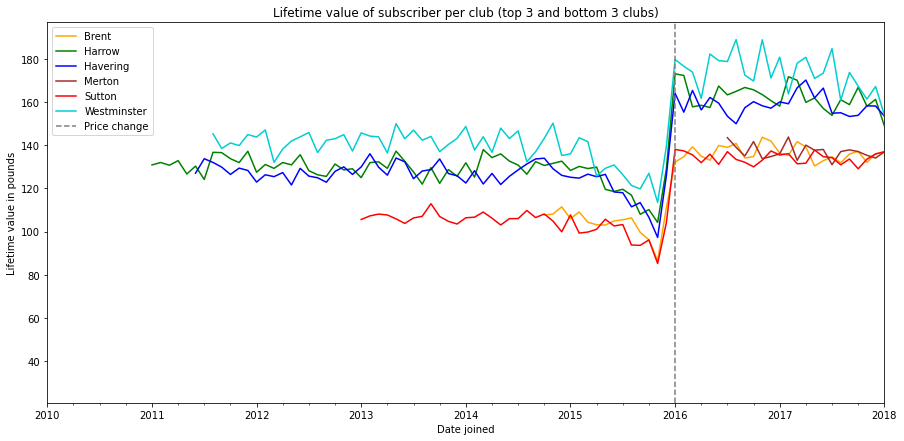

In [26]:
#computing the lifetime value of subscribers per club
ltv_club=customer_df[customer_df['Club'].isin(["Brent","Sutton","Merton","Havering","Harrow","Westminster"])].groupby(['join_date','Club']).mean()["sub_duration_month"].mul(df_per_months["ARPU"],level="join_date")

ltv_club.unstack().plot(figsize=(15,7), color={'Harrow':'green','Havering':'blue','Westminster':'darkturquoise', 'Sutton':'red','Brent':'orange','Merton':'brown'})
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.xlim('2010-01-01','2018-01-01')
plt.ylabel('Lifetime value in pounds')
plt.xlabel('Date joined') 
plt.legend()
plt.title("Lifetime value of subscriber per club (top 3 and bottom 3 clubs)")

## 2. What else drives churn other than price? (What other factors influence the likelihood of a sub leaving? 
### 2. A. Hypotheses: “Full gyms during peak hours leads to higher churn”

In order to investigate the hypothesis above, the distribution of gym visits ot the total subscriber base has been compared with the distribution of gym visits of churned subscribers. Whereas it would make sense for subscribers to show a higher churn rate if gyms were full during peak hours, we see only a very weak relationship in the data. Therefore, we can conclude that the capacity of gyms during peak hours does not drive churn. 

Text(0.5, 1.0, 'Lifetime value of subscriber per club (top 3 and bottom 3 clubs)')

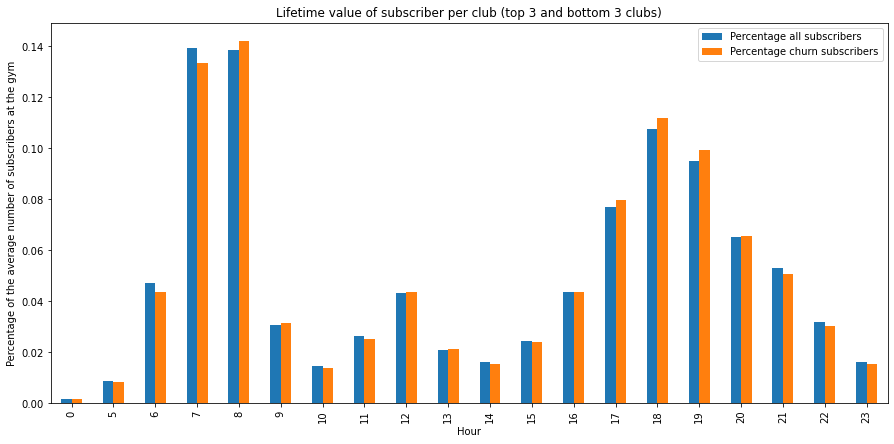

In [27]:
#we looked at how full gyms over a certain period of time : here the 2 first months of 2014
visitation_df_2014=visitation_df[(visitation_df['visit_datetime']>='2014-01-01') & (visitation_df['visit_datetime']<='2014-02-01')]
customer_df_2014 = pd.merge(left=udf[['CustomerID','Club','end_date']], right=visitation_df_2014[['CustomerID', 'visit_datetime','Hour']], on='CustomerID')

pp_per_h=pd.DataFrame(customer_df_2014.groupby(['Hour']).count()['visit_datetime'])
pp_per_h['visit_datetime_leaving']=customer_df_2014[(customer_df_2014['end_date']>='2014-01-01') & (customer_df_2014['end_date']<='2014-02-01')].groupby(['Hour']).count()['visit_datetime']

#We computed the percentage of subscribers that came to the gym each hour
#and the percentage of subscribers that came to the gym each hour and churned during those two months
pp_per_h['Percentage all subscribers']=pp_per_h['visit_datetime']/pp_per_h['visit_datetime'].sum()
pp_per_h['Percentage churn subscribers']=pp_per_h['visit_datetime_leaving']/pp_per_h['visit_datetime_leaving'].sum()

pp_per_h[['Percentage all subscribers','Percentage churn subscribers']].plot.bar(figsize=(15,7))
plt.ylabel('Percentage of the average number of subscribers at the gym')
plt.legend()
plt.title("Lifetime value of subscriber per club (top 3 and bottom 3 clubs)")

### 2. B. Hypotheses:  “A change in customer profile over time leads to a higher churn 	rate”

The graph below shows the average length of stay of subscribers that joined within the first year of a gym opening its doors (group 1) and the average length of stay of subscribers that joined after the first year of a gym opening its doors (group 2). Interestingly, the table shows a positive difference across all gyms, meaning that group 1 stayed longer than group 2. On average the difference is +10% for group one, but in certain cases the difference is as large as 40% (e.g Hammersmith). 

We believe that these findings indicate that there is a marginal difference in 	the make-up of the cohort of subscribers that joins within the first year and 	the remaining cohort. There is a variety of explanations for this occurrence, 	but we believe that the findings above indicate a decrease in quality (quality = 	length of average stay per subscriber) over time. This means that a natural 	increase in churn has to be accepted to a certain extent.


In [28]:
print('Clubs with the highest percentage difference in length of stay between the 2 groups:')
display(avg_subs1[avg_subs1!=0].sort_values(by='%_difference',ascending=False).dropna().head())
print('Clubs with the smallest percentage difference in length of stay between the 2 groups:')
display(avg_subs1[avg_subs1!=0].sort_values(by='%_difference',ascending=True).dropna().head())

Clubs with the highest percentage difference in length of stay between the 2 groups:


,group_1,group_2,difference,%_difference
Hillingdon,127.208176,30.000000,97.208176,0.764166
Hammersmith,160.274300,103.840087,56.434214,0.352110
Kensington and Chelsea,153.874002,126.989778,26.884224,0.174716
Bromley,159.392386,132.679976,26.712410,0.167589
Barking,162.800912,143.099703,19.701209,0.121014


Clubs with the smallest percentage difference in length of stay between the 2 groups:


,group_1,group_2,difference,%_difference
Ealing,157.519872,155.910677,1.609195,0.010216
Lewisham,148.076171,145.918207,2.157965,0.014573
Enfield,151.438898,148.247851,3.191047,0.021072
Greenwich,152.324702,148.535250,3.789452,0.024877
Brent,140.379806,136.439625,3.940181,0.028068


 ### 2. C. Hypotheses: “Churn rate is affected by gym location” 

To further analyse this hypothesis, let us remember our findings from 1. A. 3. b). The two gyms, Brent and Southwark, chosen based on their subscriber growth rate in 2018, one bad, one good, show a substantial difference in churn rate. This leads us to the conclusion that the churn rate depends on the location of the gym. 

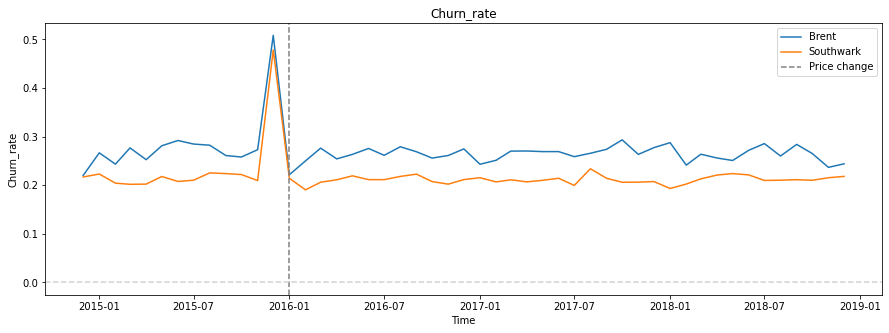

In [29]:
plot_comparison(data, 'Churn_rate')

### 2. D. Other reasons for churn not shown in data

It is important to notice at this point that not all churn reasons can be found in the dataset provided. External factors and market dynamics such as 	competitor behaviour or industry trends (e.g. more homeworksouts) are therefore, not possible to be assessed. This leaves us with an incomplete 	picture of churn reasons which shows that OC&Gym should focus on gathering more datapoints on churn behaviour in order to better understand churn reasons

## 3. What is our benchmark 

As for every business, it is important for OC&Gym to have a good unders tanding of how it’s current performance compares to the industry, but also how performance differs across gyms. For this purpose, two benchmark indicators have been chosen: 

### 3. A. Comparison of average growth rate of OC&Gym and industry growth rate 

According to IBISWorld (Reference 1) the average growth rate of the UK gym industry has been between 4-5% between the years 2015-2018. This has been compared to the the growth rate of OC&Gym in the graph below. The graph shows that OC&Gym has managed to outperform the average industry growth consistently. However, it must be noted that most of this growth has come from opening new gyms. When we previously looked at growth rate per gym, it becames apparent that many gyms are performing way below benchmark. The goal of OC&Gym should therefore be to establish a natural (excluding growth by new gym openings) growth rate of 5%. 

Text(0.5, 1.0, 'Growth Rate of our subscribed customers')

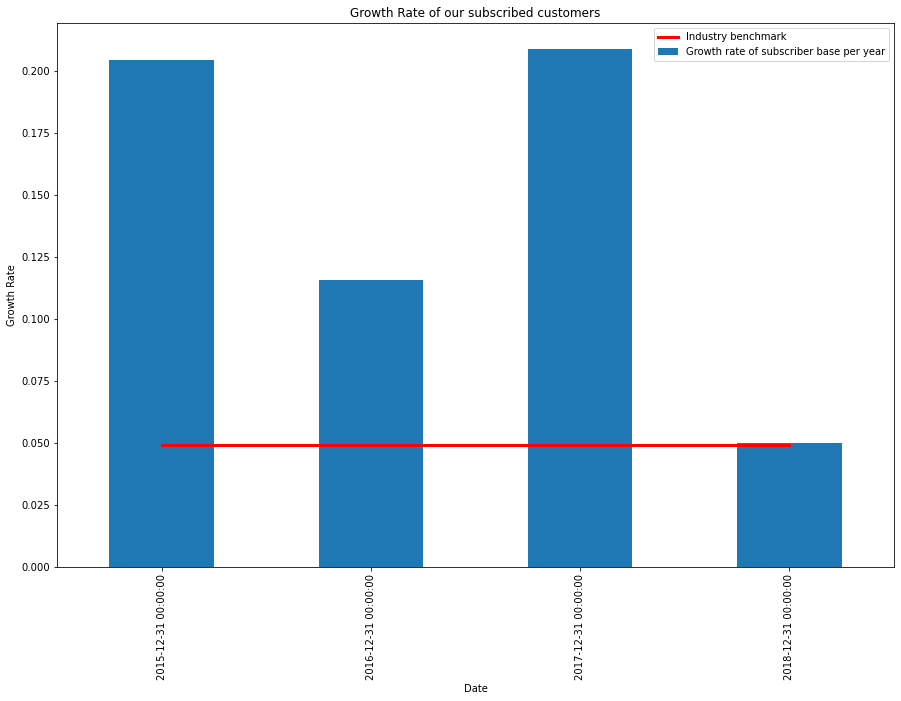

In [30]:
plt.figure(figsize=(15,10))
df_per_year['growth_rate_count']['2015-12-31':'2018-12-31'].plot.bar(label='Growth rate of subscriber base per year')
plt.plot(['2015-12-31','2016-12-31','2017-12-31','2018-12-31'], [0.049, 0.049, 0.049,0.049],color='red',linewidth=3,label='Industry benchmark')
plt.legend()
plt.ylabel('Growth Rate')
plt.title('Growth Rate of our subscribed customers')

### 3. B. Lowest churn rate of gym and compared to other gyms 

Next to subscriber base growth rate, churn plays a key role in the success of any subscribtion business model. As we were unable to find any information on industry churn rates, we used the best (lowest) churn rate of all OC&Gyms. In the graph below, this has been compared to the churn rate of the total subscriber base. Whereas it is ambitious to establish the same churn rate as in Westminster for every other gym, the graph shows clear room for improvement in churn rate. OC&Gym should aim at reducing churn which will directly lead to an increase in LTV and therefore revenue. 

Text(0.5, 1.0, 'Churn per month')

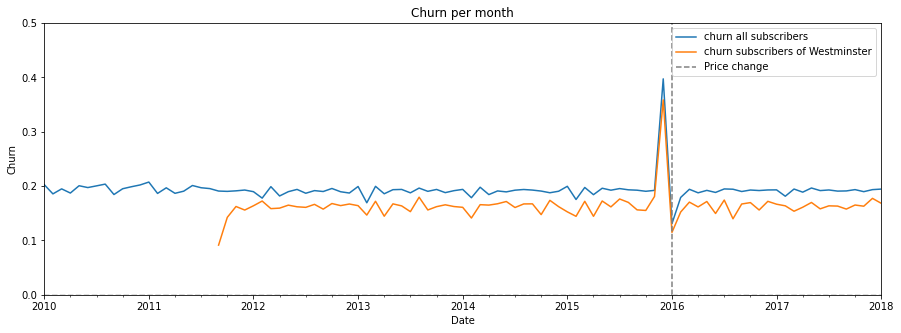

In [31]:
plt.figure(figsize=(15,5))
df_per_months['count_churn'].plot(label='churn all subscribers')
df_per_months['count_churn_westminster'].plot(label = 'churn subscribers of Westminster')
plt.axvline(pd.to_datetime("2016-01"), linestyle='dashed', color='grey', label="Price change")
plt.axhline(0, linestyle='dashed', color='lightgrey')
plt.xlim('2010-01-01','2018-01-01')
plt.ylim(0,0.5)
plt.ylabel('Churn')
plt.legend()
plt.title('Churn per month')

## 4. What does this suggest as possible options going forward? How could they improve their pricing strategy? 
### 4. A. Standard Annual Membership  

**Goal:** Increase in subscriber LTV 

**Pricing:** 270 GBP (~10x monthly standard membership price, 17% discount compared to a 1-year standard membership) 

**Impact:**

Since we are also suggesting the introduction of an off-peak membership, the standard annual membership will mainly target the peak-subscriber which make up 2/3 of the subscriber base. Of these subscribers, we know that based on past data, that 36% tend to stay between 5 and 10 months. These are the subscribers that we can reasonably expect to switch to an annual membership. As the length of the subscription is unknown when a subscriber first joins OC&Gym, makes us believe that we can use the discount (~17%) of the standard annual membership to boost the sale of annual memberships. We believe that up to 50% of subscribers of the target group above would switch to an annual membership. The increase in expected LTV of 150 to 270 (price of annual membership), is the gain in revenue that can be reasonably expected. The % of subscribers that will switch to an annual membership but would initially have contributed more revenue via the standard membership account for 9.5% of the subscriber base (subscribers that stay 10 or more months). Moreover, we believe that the annual membership can lead to an increase in subscriber acquisition as OC&Gym is able to provide a new offering to its subscribers. 

### 4. B. Off-Peak membership 
**Goal:** Better use of off-peak capacities, Increase of LTV, Acquistion of new 	subscribers 

**Pricing:** 240 GBP (~9x monthly standard membership price, 23% discount compared to a 1-year standard membership) 

Another of the changes to the pricing strategy of OC&Gym that we are proposing is the introduction of an Off-Peak Annual Membership. Similar to the standard annual membership above, the main goal of this new offering is the increase in LTV of off-peak subscribers that make up approximately 1/3 of the subscriber base. As we can see in the graph below, most visits occur during peak-hours, leaving unused gym space in off-peak hours. Therefore, we are proposing a off-peak annual membership for the following time slots (5-7am, 9-12am, 13-17pm, 9-12pm). This does not overlap with the current definition of “peak-hours” that OC&Gym is using, but we believe that this definition should be updated based on our findings. 

**Impact:** Increase in LTV and subsequent increase in Revenue 

As mentioned above, a third of our subscribers are visitng the gym mainly in off-peak hours. These subscriber are the target of the off-peak annual membership. Furthermore, we know that 34% of these subscribers on average between 5 to 9 months. Obviously, a subscriber does not know how long he or she is gonna stay with OC&Gym when sigining the inital contract, but we believe this is a good proxy for subscribers that are likely to switch to the Off-Peak Annual Membership (We further discount this number by 50% as not all subscribers will switch membership). The expected increase in LTV is the difference of the current LTV (~150 GBP) to 240, which is the price of the OP-membership. It is important to note that we are expected to lose revenue on the subscribers that would have stayed longer than the 9 months (needed to make up for the 240 GBP). However, this subscriber group only makes up ~13.5% of the total subscriber base.  Finally, we expect the OP-membership to furhter drive subscriber acquisition.

Text(0.5, 1.0, 'Number of visitors per hour')

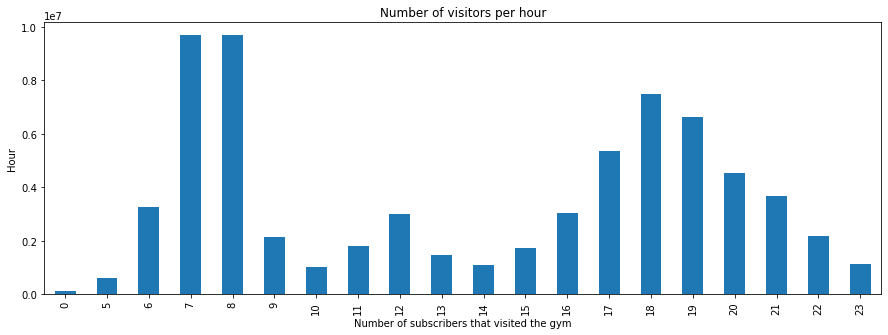

In [32]:
### Number of visitors in the gym over 2009 - 2018 per hour
plt.figure(figsize=(15,5))
visitation_df.groupby(['Hour']).count()['peakvisits'].plot.bar()
plt.xlabel('Number of subscribers that visited the gym')
plt.ylabel('Hour')
plt.title('Number of visitors per hour')

## 4. C. Increasing the price of flexible and standard membership 

An additional way to increase the current revenue of OC&Gym would be to increase the price of the standard and flexible membership even further. The analysis above shows that the reaction to the price increase at the end of 2015, even though strong, had only a short-term impact and subscriber numbers and revenue quickly recovered. This could lead to the possible conclusion that a further price increase would create a similar situation and OC&Gym would be able to benefit from the higher prices. 

Even though the argument above does carry some weight, we firmly believe that increasing the price of the current memberships is not the correct way to address the current problem. We believe that it does not tackle the underlying issues such a low LTV and a high churn rate. Furthermore, a second price increase within a short time-period could lead to an even further increase in churn. Finally, increasing the price of flexible and standard membership would put OC&Gym closer to the pricing of its main competitor and would therefore lose a key differentiation aspect. 





## 5. Reducing churn by increasing customer engagement
### 5. A. Reducing churn

In the analysis above, we have been able to see that churn plays an important role in the success of OC&Gym. In order to ensure long-term growth for the company, the churn rate must be reduced as a high-churn rate will not always be able to be compensated by a high number of new subscribers. Especially in areas where the gym market is becoming more and more saturated, this will prove a key challenge for OC&Gym. 

We have further seen that churn has different drivers, some more easily to be identified and some more complex. The analysis has clearly shown that churn needs further investigation and more aspects of subscriber behaviour need to be looked into to get a better understanding of why a subscriber is leaving OC&Gym. However, we were able to identify key differences in in churn behaviour when comparing subscriber segments differentiated by the frequency of their gym visits. Subscriber with an average of 2-3 visits per week show a much larger LTV compared to subscribers that visits 1-2 per week. LTV further increases with more visits per week. This shows that the churn rate of more engaged subscribers is clearly lower.  

### 5. B. Collecting further infromation on churn behaviour

Returning to the argument made above, this analysis has managed to shed lights on important reasons why a subscriber is leaving OC&Gym. On the one hand, we have learned a natural increase in a churn rate over time is to be expected as the quality of subscriber decreases with the saturation of the market. On the other hand, we have also seen that factors such as a full gym during peak hours does not lead an increase in churn, even though one might quite reasonably assume. Furthermore, we have seen considerable differences in churn across gyms. 

In conclusion, we can say that many different factors need to be considered to better understand churn and consequently develop appropriate measures to reduce it. Therefore, we believe that more information on churn behaviour needs to be collected (e.g survey on churn reasons). This will help to build a more accurate model for churn prediction which is key for a sustainable growth rate for OC&Gym. 

## Conclusion

The main business problem facing OC&Gym is their slowing revenue growth. This is directly as a result of their slowing subscriber growth rate. The increase in price across subscription types has failed to negate this slowdown. We have found that the company could potentially solve these problems by focussing on increasing the LTV of their existing subscribers through providing an annual subscription and an annual off-peak subscription. As we are pricing these subscriptions above the LTV of our standard subscribers and standard off-peak subscribers respectively, these strategies should provide an uplift to revenue. We believe the low monthly cost of these strategies will also prove helpful in attracting new subscribers to the gyms. Furthermore, past data show a strong correlation between subscriber engagement (as visits per week) and the average length of stay. Therefore, OC&Gym should focus on increasing subscriber engagement. 

This report does not provide the evidence to prove our initial hypotheses that there would be a change in the makeup of our subscriber base. In general, it can be said that the different segments analysed are homogeneous and differences are difficult to identify. The major differences and insights have been used to derive the strategic recommendations of this report. 

With regards to churn, this analysis has clearly shown that more data on churn behaviour needs to be collected. Combined with the fact that OC&Gym is facing a constant churn rate of 20%, this should become a major focus for the company in the coming months. We firmly believe that through the collection of more data, an accurate prediction model can be built. This can then function as the basis for the development of targeted churn prevention measures. 


## References

Reference 1 (2020, October 30) Gyms & Fitness Centres in the UK
https://www.ibisworld.com/united-kingdom/market-research-reports/gyms-fitness-centres-industry/  


## Appendix 



### For subscribers who have the same Join and End date, when did they last visit the gym.

In [33]:
# people who have the same join and end date and who left at a certain time (here 2017-09-01)
# we are looking at when they last visited the gym to know if the 'End Date' is the actual end date or a notice period and if the 3 months notice is respected for this specific case (it is not)
us1=udf[(udf['join_date']==udf['end_date']) & (udf['end_date']=='2017-09-01')]
end_date_sub= pd.merge(left=us1, right=visitation_df[visitation_df['visit_datetime']>'2017-09-01'][['visit_datetime','CustomerID']], on='CustomerID')
print(end_date_sub['visit_datetime'].max())

2017-09-28 23:00:00


### Frequency of active customers that were not covered in 1. A. 1. d) i) Split of Customer Segments 

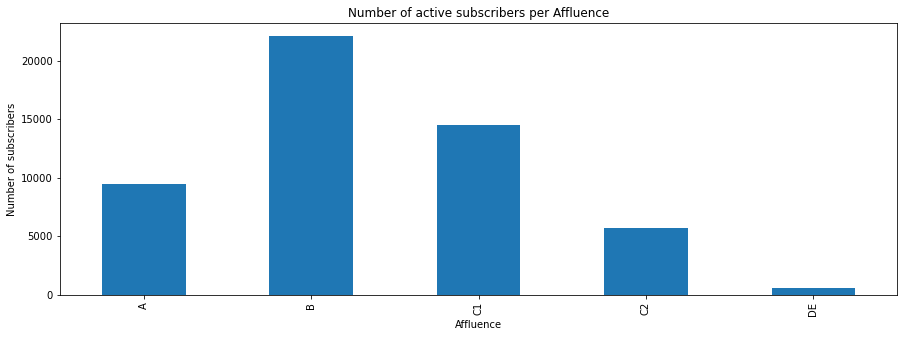

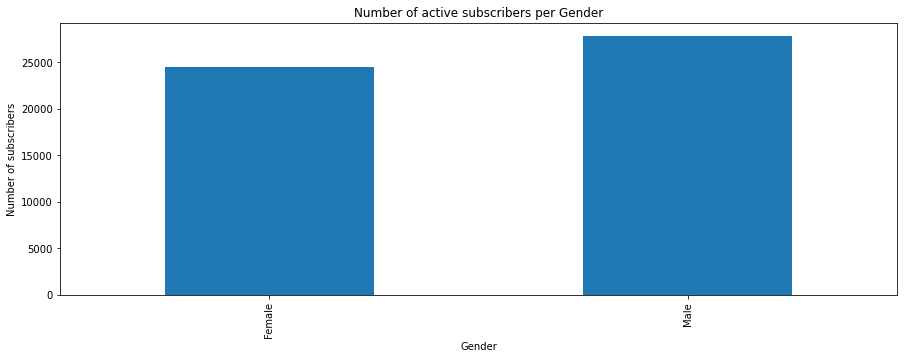

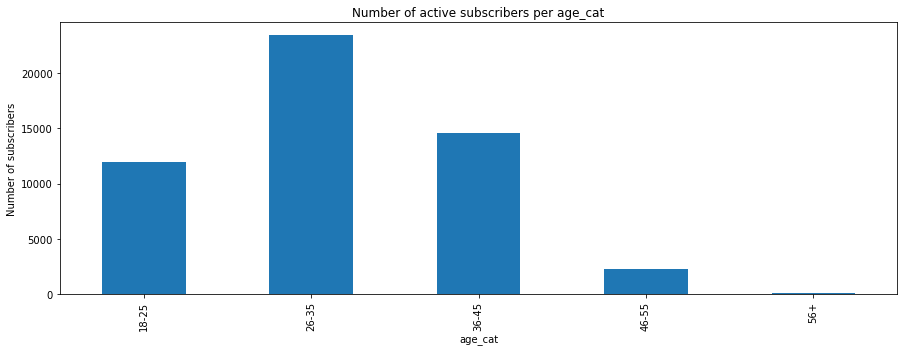

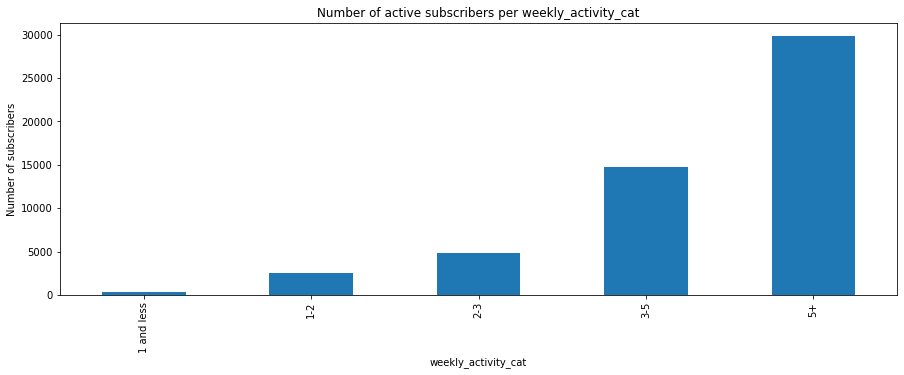

In [34]:
for cat in ['Affluence', 'Gender', 'age_cat','weekly_activity_cat']:
    plt.figure(figsize=(15,5))
    customer_df[customer_df["status"]=="active"].groupby(cat).count()['CustomerID'].plot(kind='bar')
    plt.title('Number of active subscribers per '+cat)
    plt.ylabel('Number of subscribers')

### Differences across segments in terms of subscriber join rates and churn rates

For an absolute number of subscribers : 
For subscribers in relative term : 
CPU times: user 13 s, sys: 999 ms, total: 14 s
Wall time: 14.5 s


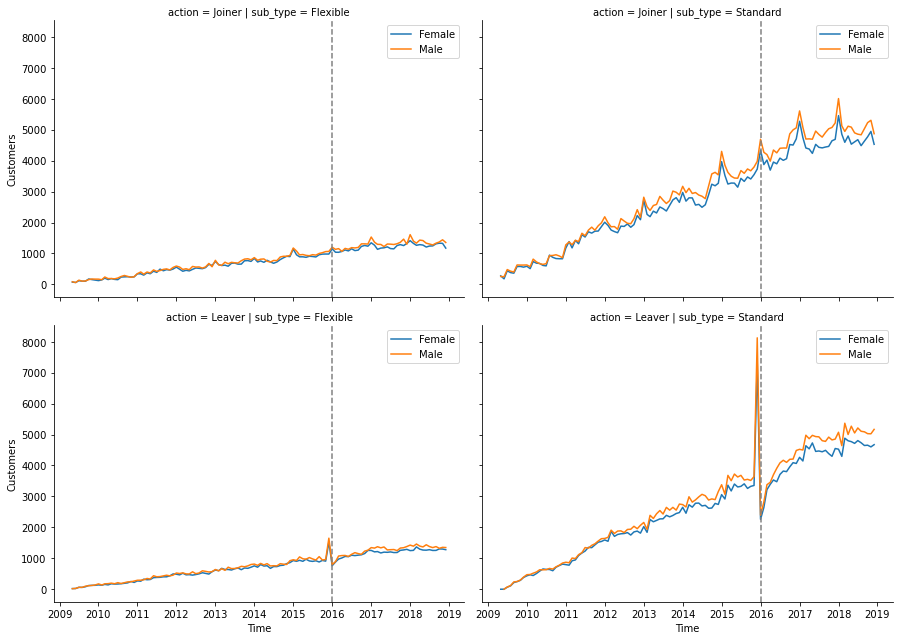

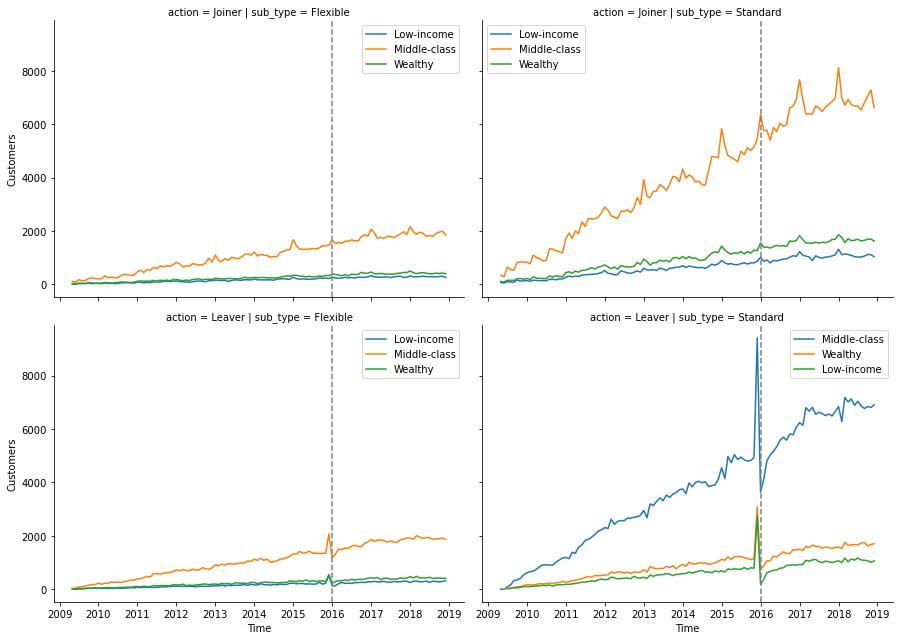

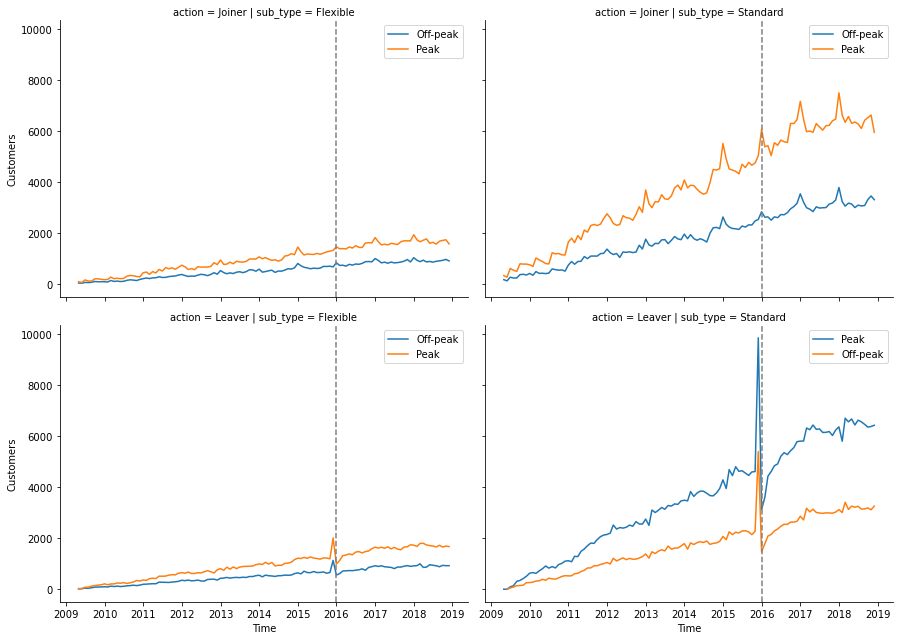

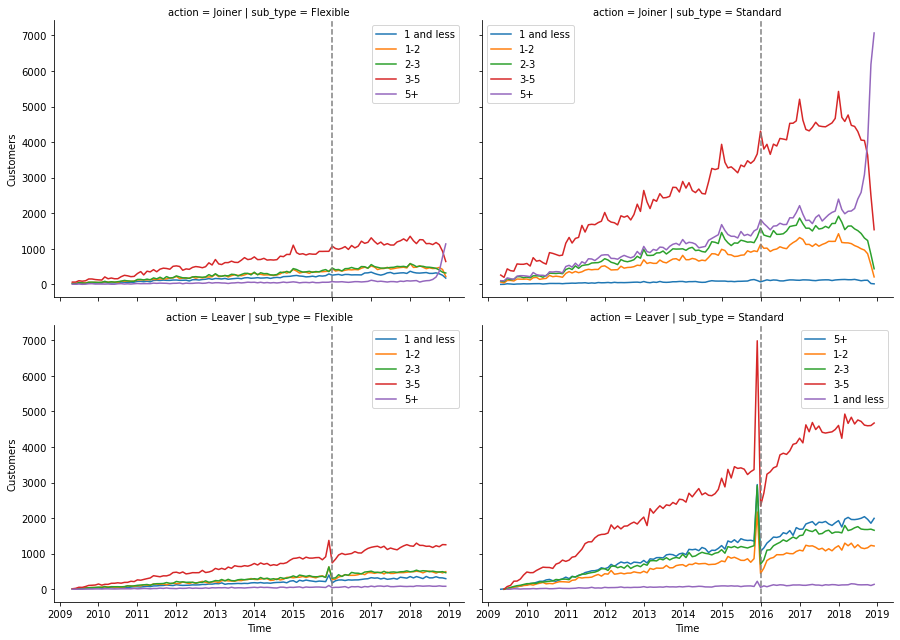

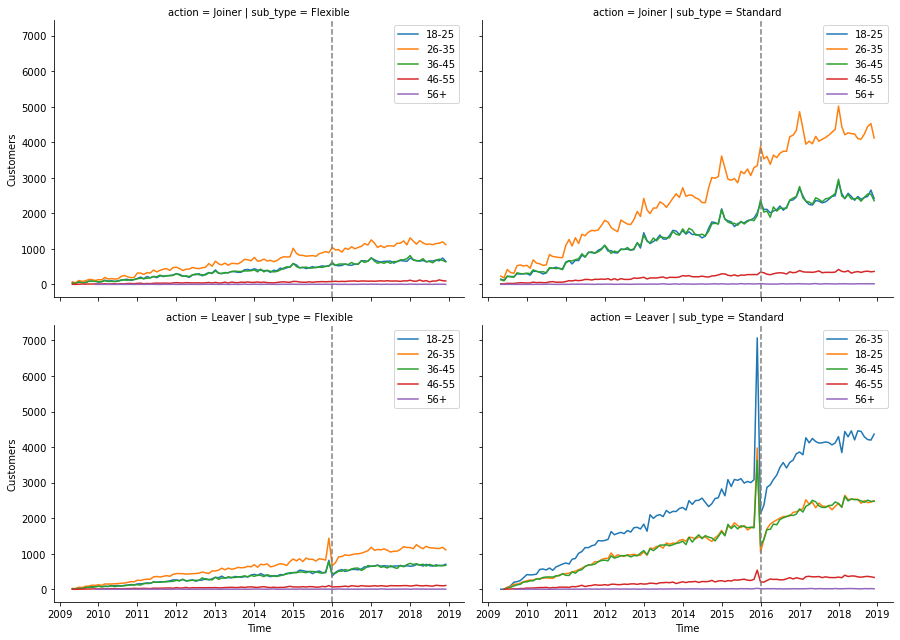

...

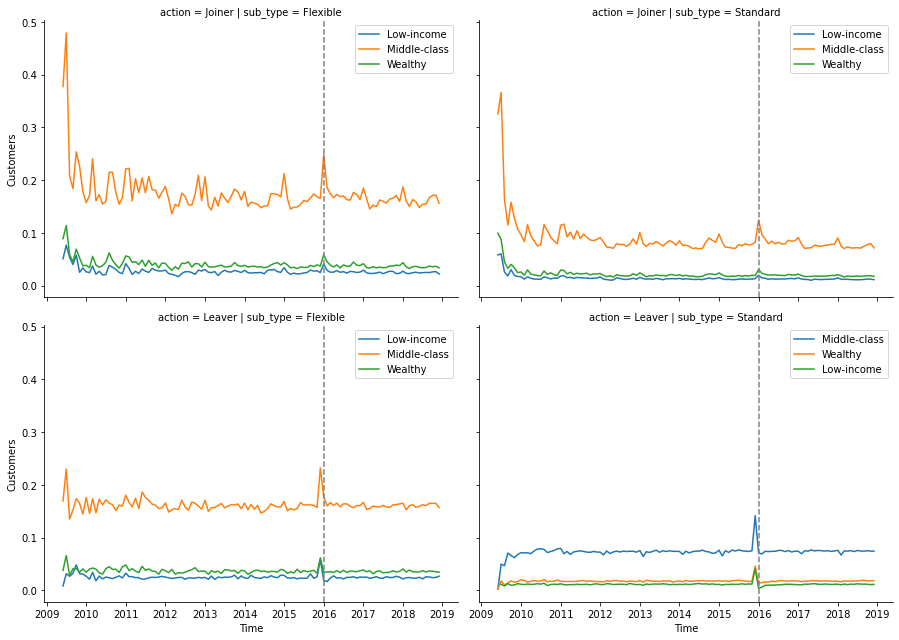

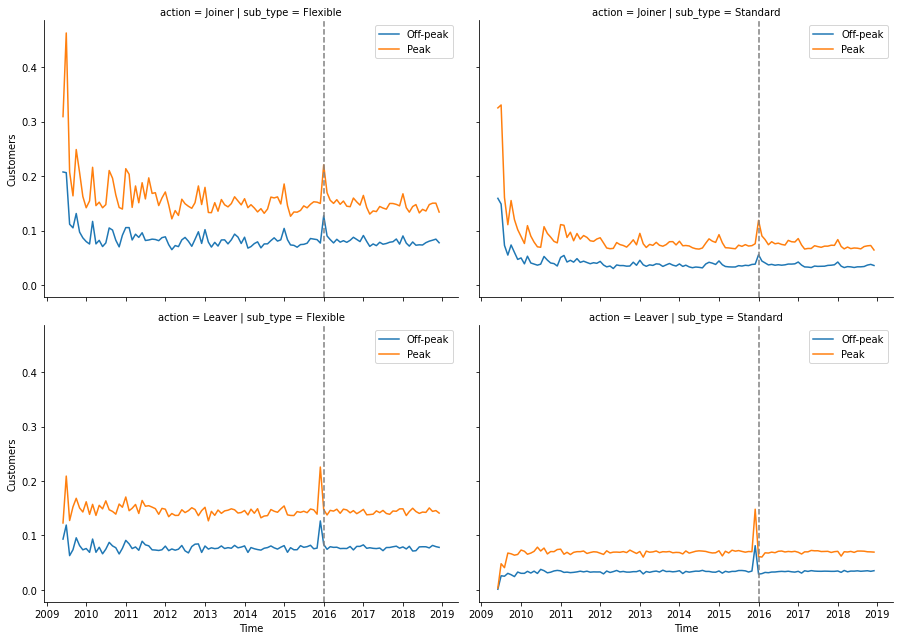

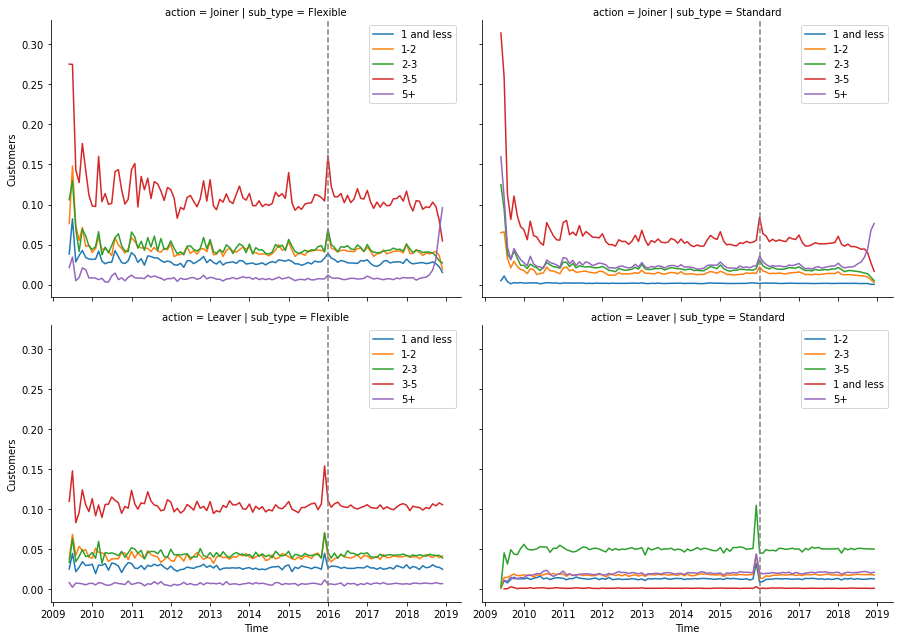

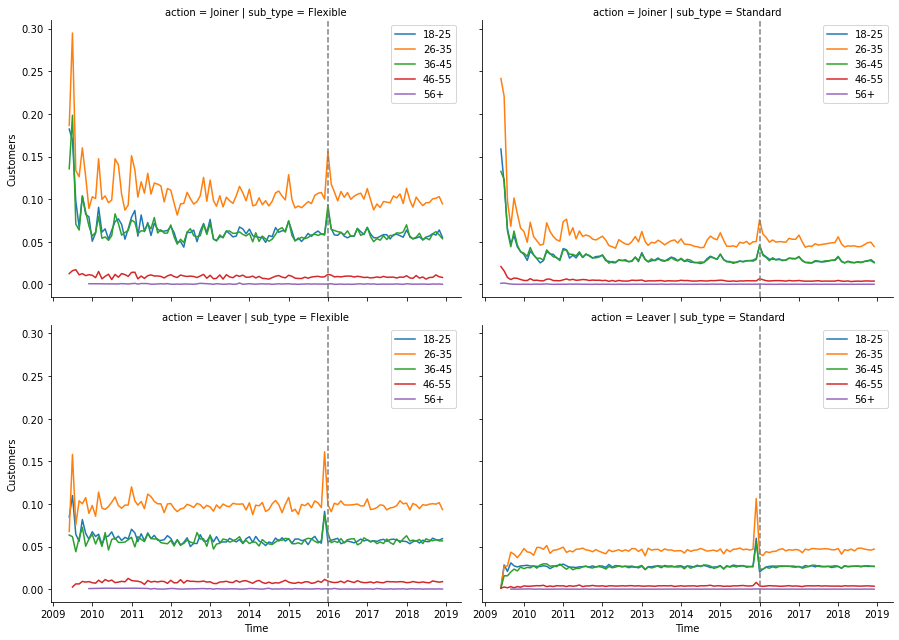

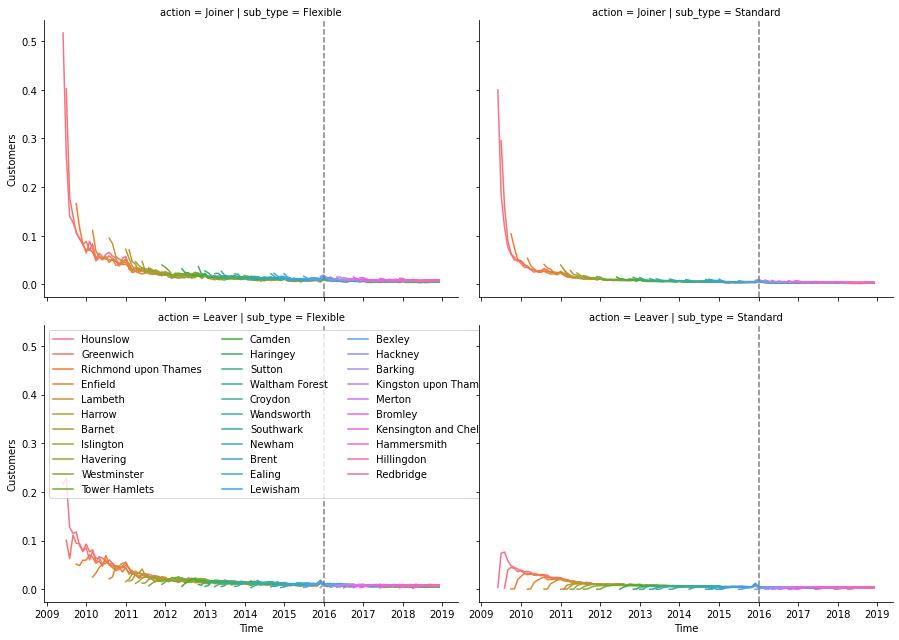

In [35]:
%%time
grps = ['Gender', 'income', 'visitor_type', 'weekly_activity_cat', 'age_cat', 'Club']
#In absolute number of subscribers
print("For an absolute number of subscribers : ")
for grp in grps:
    if grp == 'income':
        c_df = c_df.loc[c_df.income != 'Unemployed']
    seg = segment(c_df, grp)
    plot_segment(seg, grp)

print("For subscribers in relative term : ")
#Relative
for grp in grps:
    if grp == 'income':
        c_df = c_df.loc[c_df.income != 'Unemployed']
    seg = segment(c_df, grp)
    plot_segment(to_relative(seg), grp)

### Other plots of comparison of High-growth and Low-growth locations 

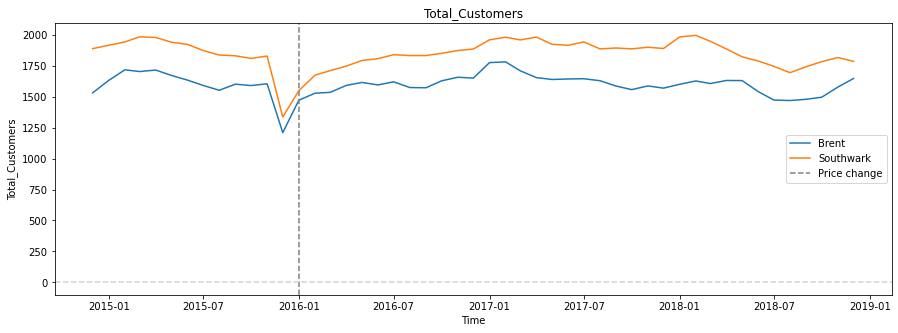

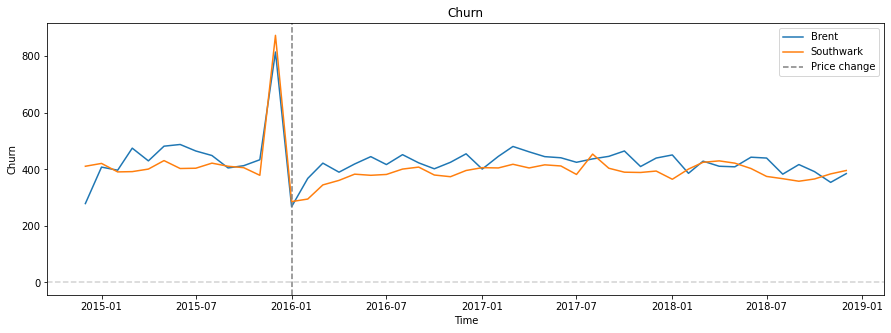

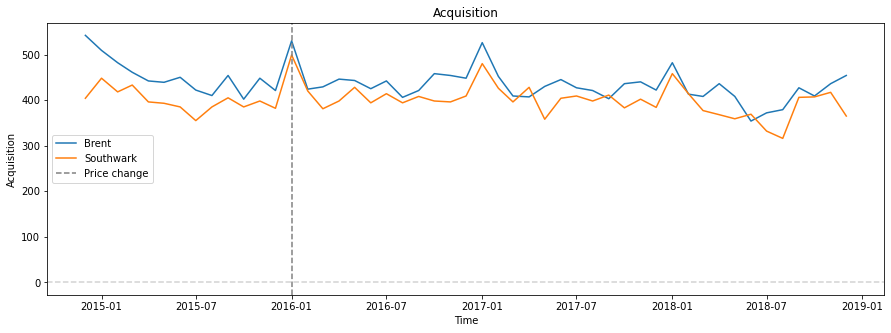

In [36]:
plot_comparison(data, 'Total_Customers')
plot_comparison(data, 'Churn')
plot_comparison(data, 'Acquisition')

### Differences in patterns across segments

CPU times: user 3.24 s, sys: 92.3 ms, total: 3.33 s
Wall time: 3.37 s


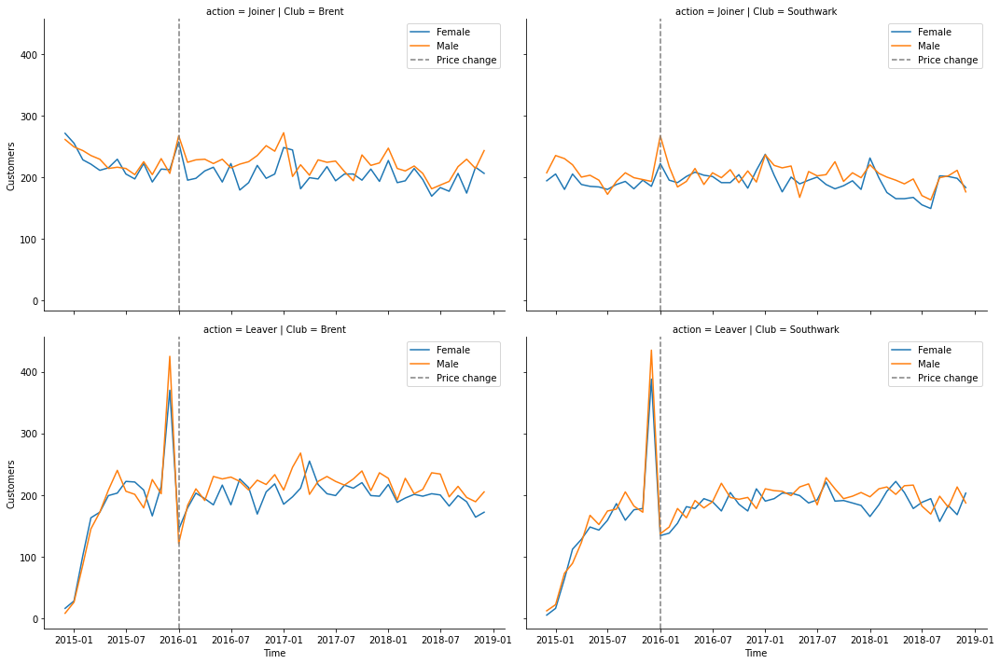

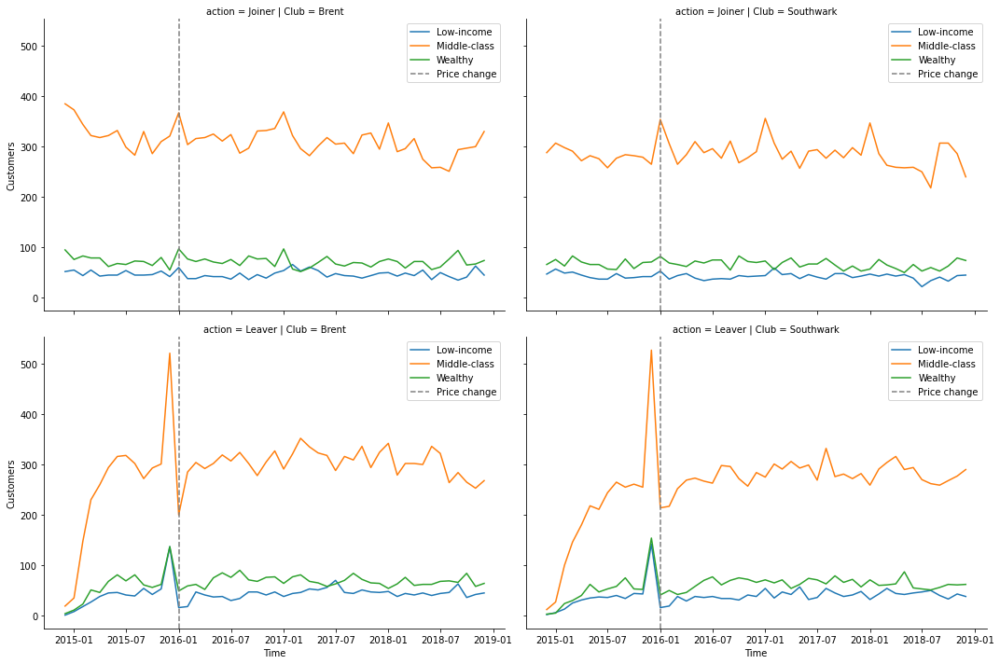

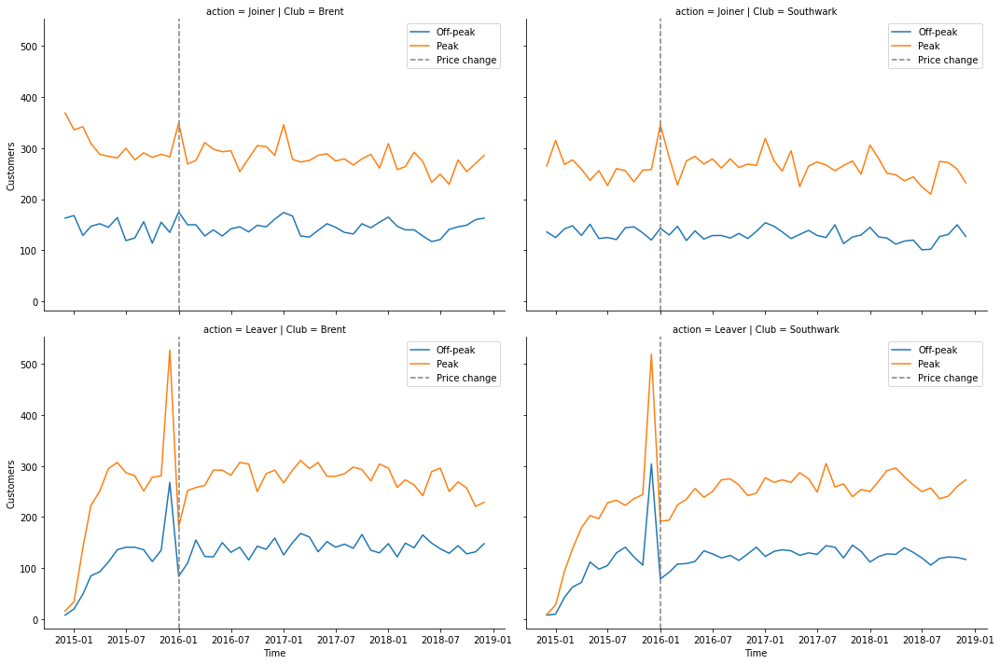

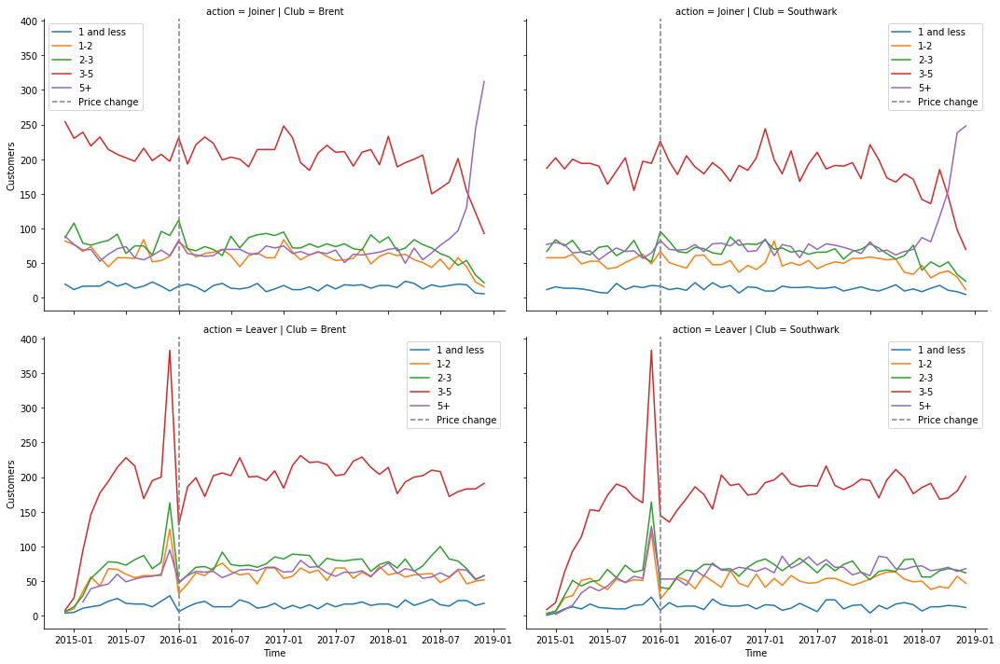

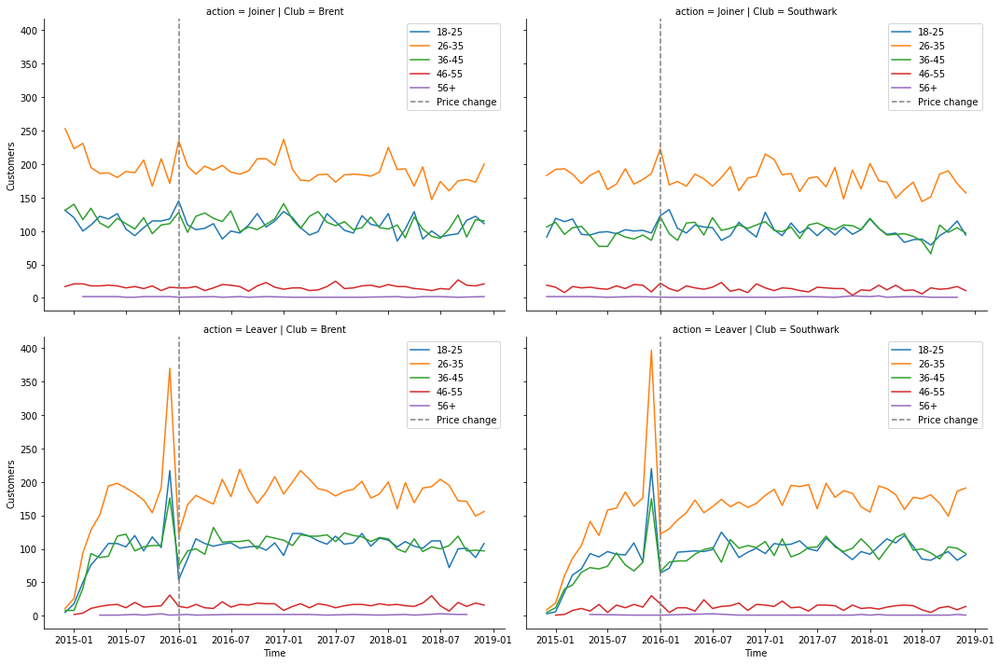

In [37]:
%%time
club_data = c_df.loc[(c_df.Club.isin(comparison)) & (c_df.join_date >= '2014-12-01')]
grps = ['Gender', 'income', 'visitor_type', 'weekly_activity_cat', 'age_cat']
for grp in grps:
    seg = segment_club(club_data, grp)
    plot_segmentation(seg, grp)

### Distribution of the avergage subscription duration in months - used in the presentation

Text(0.5, 1.0, 'Distribution of the avergage subscription duration in months')

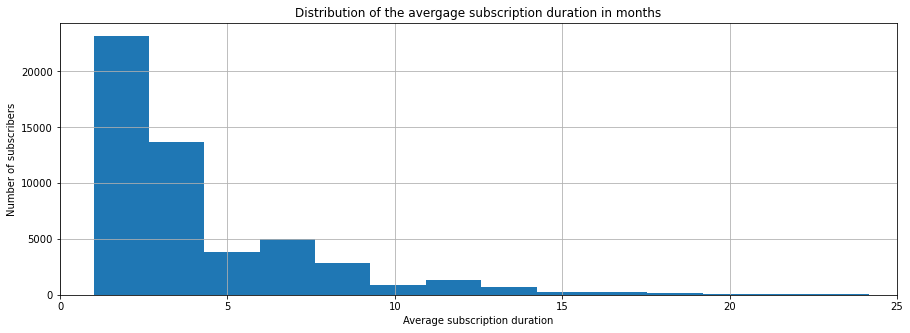

In [38]:
plt.figure(figsize=(15,5))
customer_df[customer_df['status']=='active']['sub_duration_month'].hist(bins=26)
plt.xlim(0, 25)
plt.xlabel('Average subscription duration')
plt.ylabel('Number of subscribers')
plt.title('Distribution of the avergage subscription duration in months')

### Other plots used for context and explanatory analysis

Text(0.5, 1.0, 'Number of visitations per weekday (0 is sunday)')

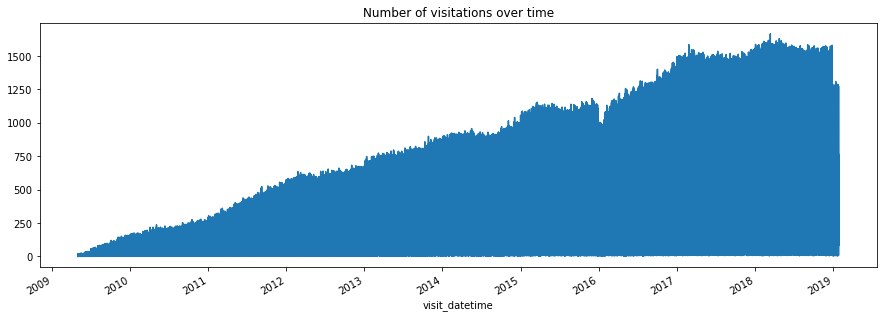

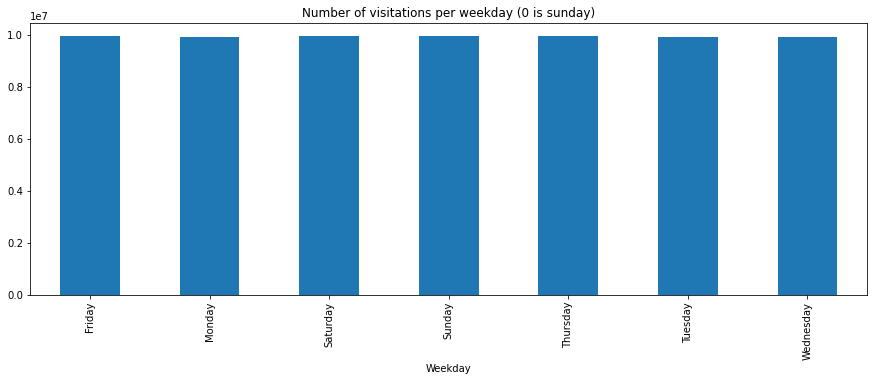

In [39]:
plt.figure(figsize=(15,5))
visitation_df.groupby(['visit_datetime']).count()['peakvisits'].plot()
plt.title('Number of visitations over time')

plt.figure(figsize=(15,5))
visitation_df.groupby(['Weekday']).count()['peakvisits'].plot.bar()
plt.title('Number of visitations per weekday (0 is sunday)')

Text(0.5, 1.0, 'Overall number of subscribers per type of subscription per months')

<Figure size 1080x360 with 0 Axes>

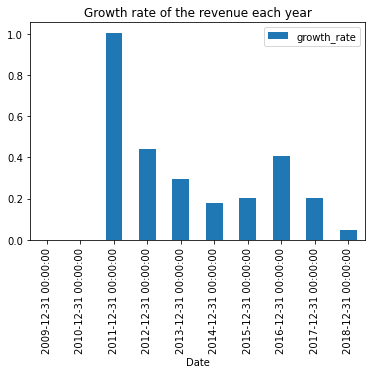

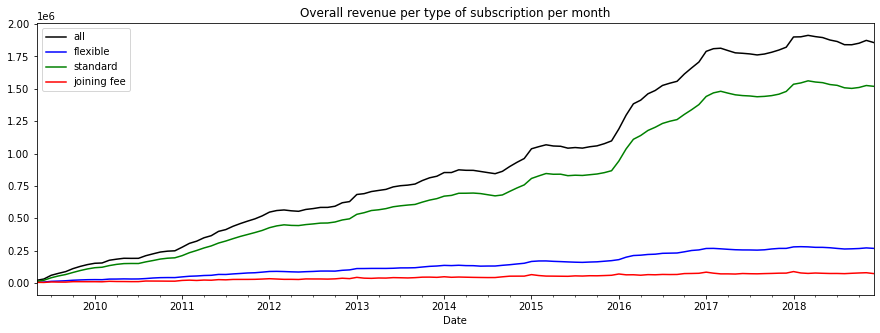

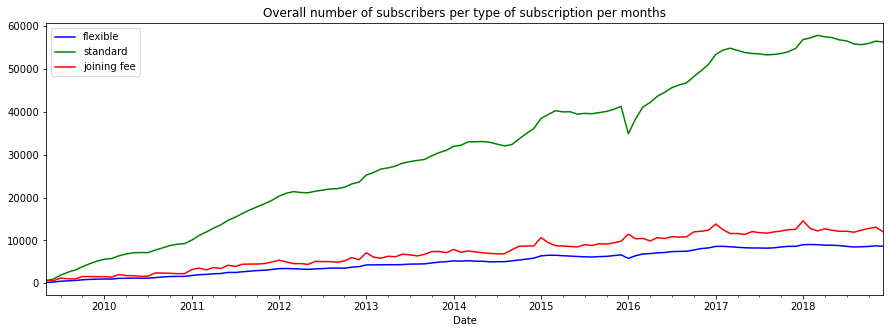

In [40]:
plt.figure(figsize=(15,5))
df_per_year.plot(y='growth_rate', kind='bar')
plt.title('Growth rate of the revenue each year')

plt.figure(figsize=(15,5))
df_per_months['all'].plot(c='black',label='all')
df_per_months['revenues_flexible'].plot(c='blue',label='flexible')
df_per_months['revenues_standard'].plot(c='green',label='standard')
df_per_months['revenues_join'].plot(c='red',label='joining fee')
plt.legend()
plt.title('Overall revenue per type of subscription per month')

plt.figure(figsize=(15,5))
df_per_months['count_flexible'].plot(c='blue',label='flexible')
df_per_months['count_standard'].plot(c='green',label='standard')
df_per_months['count_join'].plot(c='red',label='joining fee')
plt.legend()
plt.title('Overall number of subscribers per type of subscription per months')

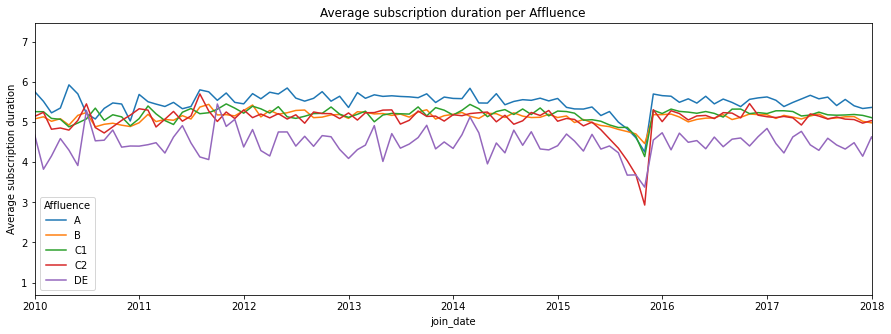

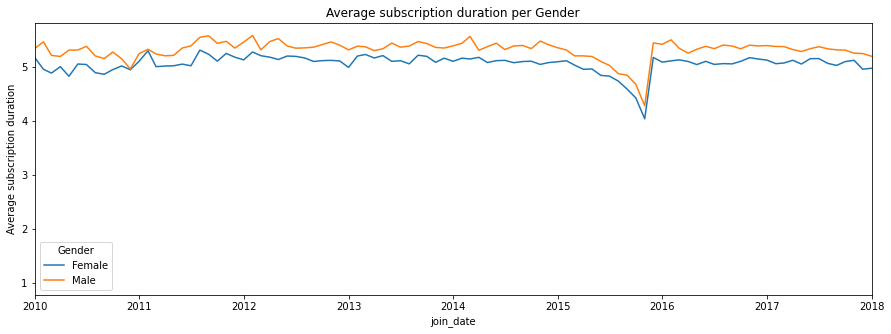

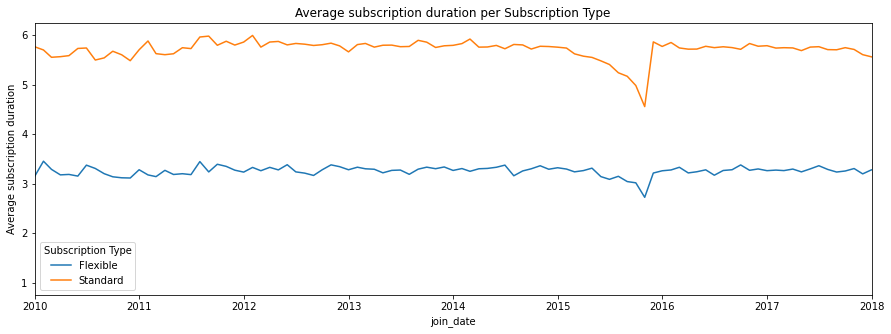

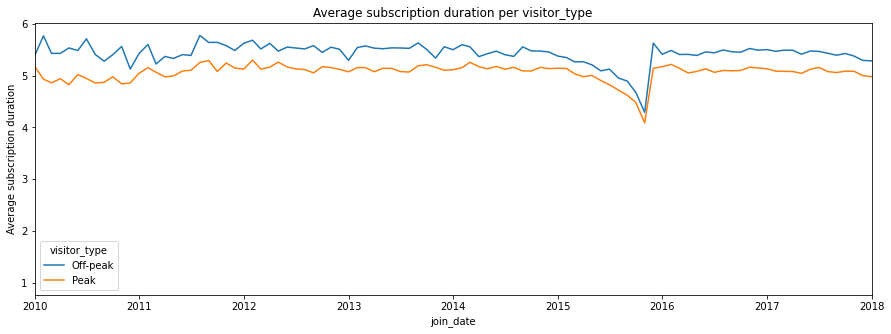

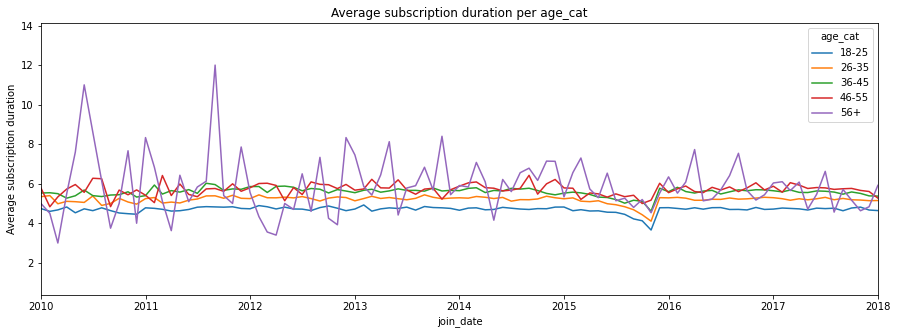

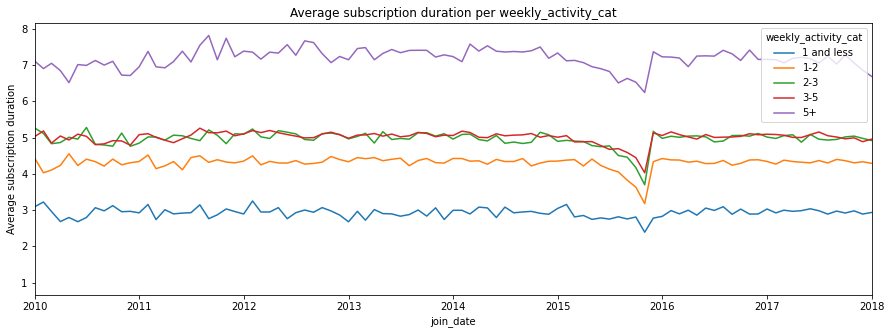

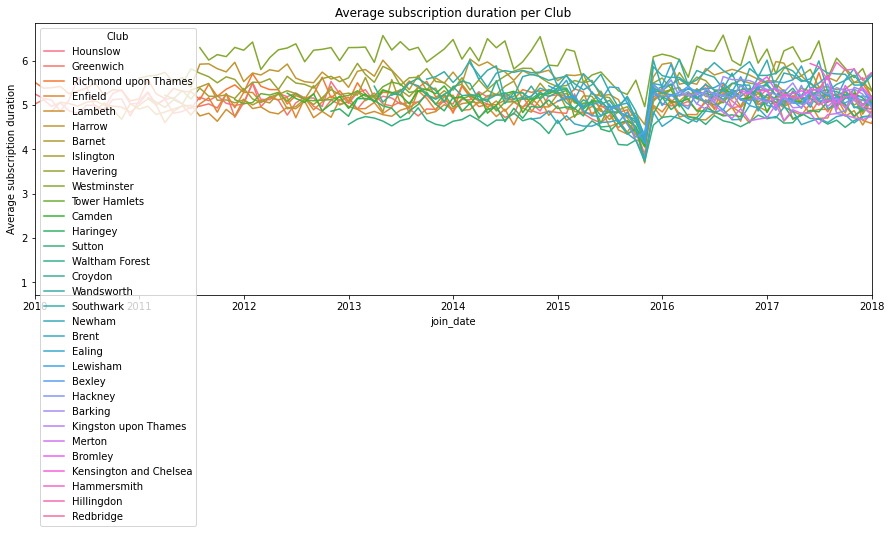

In [41]:
#in the report : 'Subscription Type' and 'weekly_activity_cat'
for cat in ('Affluence','Gender','Subscription Type','visitor_type','age_cat','weekly_activity_cat','Club'):
    plt.figure(figsize=(15,5))
    sns.lineplot(x='join_date', y="sub_duration_month", hue=cat, data=customer_df.groupby(['join_date',cat]).mean())
    plt.xlim('2010-01-01','2018-01-01')
    plt.ylabel('Average subscription duration')
    plt.title('Average subscription duration per '+cat)

This following cell is a declination of the revenue study included in the report, this time segmented by affluence groups. We created this analysis to understand the impact of subscribers' affluence on OC&Gym revenues.

In [53]:
df_per_months['count_flexible_A']=0
df_per_months['count_flexible_B']=0
df_per_months['count_flexible_C1']=0
df_per_months['count_flexible_C2']=0
df_per_months['count_flexible_DE']=0
df_per_months['count_standard_A']=0
df_per_months['count_standard_B']=0
df_per_months['count_standard_C1']=0
df_per_months['count_standard_C2']=0
df_per_months['count_standard_DE']=0
for i in range(len(user_subs)):
    start=user_subs['join_date'][i]
    end=user_subs['end_date'][i]
    if pd.isnull(end):
        end = user_subs['join_date'].max()
    subs=user_subs['Subscription Type'][i]
    affl=user_subs['Affluence'][i]
    
    #checking if the subscription is flexible or standard to know what type of subscription to count
    if subs=='Flexible':
        # for each month between the start and the end of the subscription, we add 1 count to the revenues count
        for j in pd.date_range(start, end, freq='MS'):
            col_name='count_flexible_'+affl
            df_per_months[col_name][j]+=1
    if subs=='Standard':
        for j in pd.date_range(start, end, freq='MS'):
            col_name='count_standard_'+affl
            df_per_months[col_name][j]+=1

df_per_months['revenues_A']=0
df_per_months['revenues_B']=0
df_per_months['revenues_C1']=0
df_per_months['revenues_C2']=0
df_per_months['revenues_DE']=0

for i in df_per_months.index:
    df_per_months['revenues_A'][i]=df_per_months['count_flexible_A'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Flexible'] + df_per_months['count_standard_A'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Standard']
    df_per_months['revenues_B'][i]=df_per_months['count_flexible_B'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Flexible'] + df_per_months['count_standard_B'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Standard']
    df_per_months['revenues_C1'][i]=df_per_months['count_flexible_C1'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Flexible'] + df_per_months['count_standard_C1'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Standard']
    df_per_months['revenues_C2'][i]=df_per_months['count_flexible_C2'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Flexible'] + df_per_months['count_standard_C2'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Standard']
    df_per_months['revenues_DE'][i]=df_per_months['count_flexible_DE'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Flexible'] + df_per_months['count_standard_DE'][i]*rate_card[(rate_card.type=='Client')&(rate_card['Year']==i.year)]['Standard'] 


Text(0.5, 1.0, 'Stacked revenue per affluence group per year')

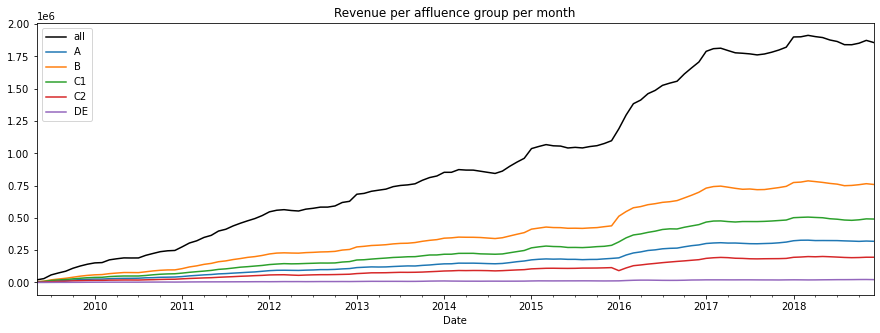

<Figure size 1080x360 with 0 Axes>

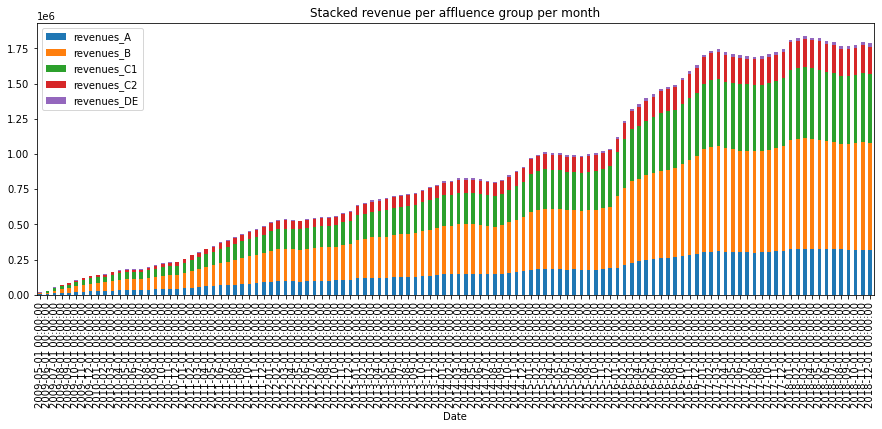

<Figure size 1080x360 with 0 Axes>

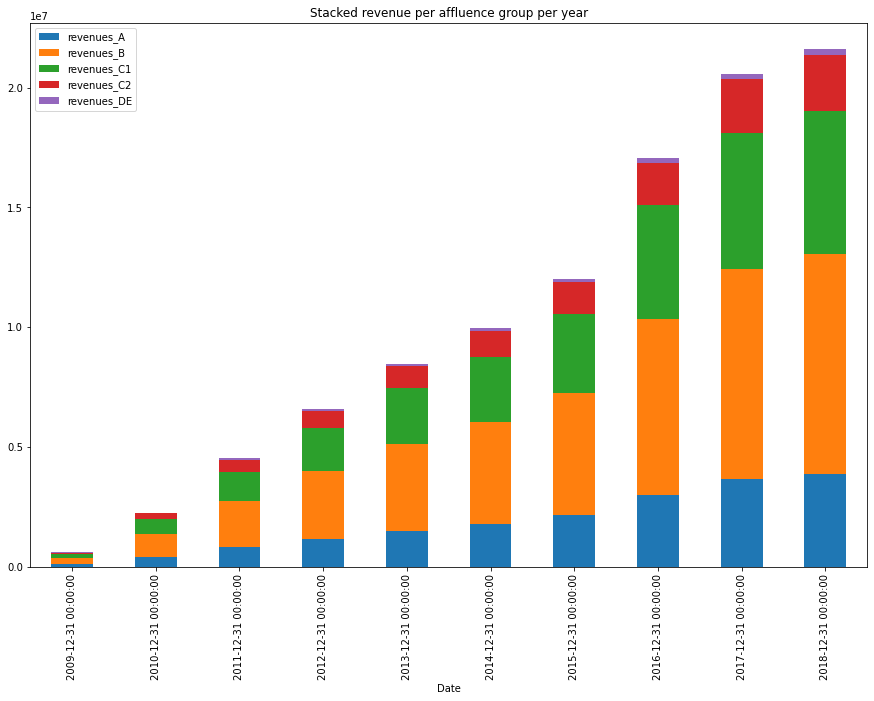

In [55]:
plt.figure(figsize=(15,5))
df_per_months['all'].plot(c='black',label='all')
df_per_months['revenues_A'].plot(label='A')
df_per_months['revenues_B'].plot(label='B')
df_per_months['revenues_C1'].plot(label='C1')
df_per_months['revenues_C2'].plot(label='C2')
df_per_months['revenues_DE'].plot(label='DE')
plt.legend()
plt.title('Revenue per affluence group per month')

plt.figure(figsize=(15,5))
df_per_months.plot(y=['revenues_A', 'revenues_B', 'revenues_C1','revenues_C2','revenues_DE'], kind="bar",stacked=True, figsize=(15, 5))
plt.title('Stacked revenue per affluence group per month')

plt.figure(figsize=(15,5))
df_per_months.groupby(pd.Grouper(freq="Y")).sum().plot(y=['revenues_A', 'revenues_B', 'revenues_C1','revenues_C2','revenues_DE'], kind="bar",stacked=True, figsize=(15, 10))
plt.title('Stacked revenue per affluence group per year')